# Human

In [22]:
human = sc.read_10x_mtx('data/GSE186158/GSE186158_RAW/GSM5639498_Human.tar/filtered_feature_bc_matrix')

In [37]:
human = sc.read_10x_mtx(
    'data/GSE186158/GSE186158_RAW/GSM5639498_Human.tar/filtered_feature_bc_matrix', 
    var_names='gene_symbols',                
    cache=True)

In [39]:
human

AnnData object with n_obs × n_vars = 16953 × 33538
    var: 'gene_ids', 'feature_types'

### 质控

In [31]:
# 1. 计算质控指标（细胞水平）
# 计算每个细胞的基因数、UMI数
sc.pp.calculate_qc_metrics(human, inplace=True, percent_top=None, log1p=False)

In [51]:
human.var['mt'] = human.var_names.str.startswith('MT-')
# 计算线粒体基因占比
sc.pp.calculate_qc_metrics(
    human, qc_vars=['mt'], inplace=True, 
    percent_top=None, log1p=False
)

In [52]:
human

AnnData object with n_obs × n_vars = 16953 × 17963
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [53]:
# 3. 计算每个细胞的UMIs/基因数量（平均基因表达分子量）
human.obs['umi_gene_ratio'] = human.obs['total_counts'] / human.obs['n_genes_by_counts']

In [55]:
# 4. 细胞水平过滤（严格按你的规则）
print(f"过滤前细胞数: {human.n_obs}, 基因数: {human.n_vars}")
    
cell_filter = (
    (human.obs['n_genes_by_counts'] >= 20) &  # 基因数≥20
    (human.obs['pct_counts_mt'] <= 10) &      # 线粒体占比≤10%
    (human.obs['umi_gene_ratio'] >= 1.7) &  # UMI/基因比≥1.7
    (human.obs['umi_gene_ratio'] <= 7)   # UMI/基因比≤7
)
human = human[cell_filter, :].copy()
print(f"细胞过滤后: {human.n_obs} 个细胞")

过滤前细胞数: 16953, 基因数: 17963
细胞过滤后: 14118 个细胞


In [56]:
# 5. 基因水平过滤（仅保留至少3个细胞表达的基因）
sc.pp.filter_genes(human, min_cells=3)
print(f"基因过滤后: {human.n_vars} 个基因")

基因过滤后: 17611 个基因


In [ ]:
sc.pp.filter_cells(human, min_genes=20) # 每一个细胞至少表达20个基因
sc.pp.filter_genes (human, min_cells=3) # 每一个基因至少在3个细胞中表达 

In [57]:
# 6. 关键：保留原始表达矩阵（适配TACMAN的preprocess.py）
human.raw = human.copy()

In [59]:
human.write_h5ad("human_qc.h5ad")

... storing 'feature_types' as categorical
... storing 'feature_types' as categorical


### 细胞类型注释

In [29]:
import celltypist
from celltypist import models

model = models.Model.load(model='Immune_All_High.pkl')

In [61]:
# 深拷贝，避免修改原始质控数据
human_celltypist = human.copy()
    
# 步骤1：CPM归一化（标准化到每个细胞10000 counts）
sc.pp.normalize_total(human_celltypist, target_sum=1e4)
    
# 步骤2：log1p转换（CellTypist必须）
sc.pp.log1p(human_celltypist)

In [63]:
predictions = celltypist.annotate(
        human_celltypist,
        model=model,
        majority_voting=True  # 提升注释准确性
    )
predictions.predicted_labels

🔬 Input data has 14118 cells and 17611 genes
🔗 Matching reference genes in the model
🧬 5310 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
2026-03-09 23:00:26.142989: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


,predicted_labels,over_clustering,majority_voting
AAACCTGAGAGGTAGA-1,ILC,53,ILC
AAACCTGAGCAAATCA-1,ILC,5,ILC
AAACCTGAGCAGACTG-1,B cells,11,B cells
AAACCTGAGCGATTCT-1,T cells,56,T cells
AAACCTGAGCTGCAAG-1,T cells,62,T cells
...,...,...,...
TTTGTCATCGCCGTGA-1,T cells,4,T cells
TTTGTCATCGCTAGCG-1,T cells,0,T cells
TTTGTCATCTATCCTA-1,B cells,45,B cells
TTTGTCATCTTGCCGT-1,T cells,67,T cells


In [65]:
human.obs["cell_type"] = predictions.predicted_labels["majority_voting"]

In [69]:
human.obs["cell_type"].value_counts

<bound method IndexOpsMixin.value_counts of AAACCTGAGAGGTAGA-1        ILC
AAACCTGAGCAAATCA-1        ILC
AAACCTGAGCAGACTG-1    B cells
AAACCTGAGCGATTCT-1    T cells
AAACCTGAGCTGCAAG-1    T cells
                       ...   
TTTGTCATCGCCGTGA-1    T cells
TTTGTCATCGCTAGCG-1    T cells
TTTGTCATCTATCCTA-1    B cells
TTTGTCATCTTGCCGT-1    T cells
TTTGTCATCTTTACGT-1    B cells
Name: cell_type, Length: 14118, dtype: category
Categories (5, object): ['B cells', 'ILC', 'Macrophages', 'Plasma cells', 'T cells']>

In [87]:
print(adata.obs['cell_type'].value_counts().sort_index())

cell_type
B cells         4582
ILC             3631
Macrophages      208
Plasma cells     750
T cells         4947
Name: count, dtype: int64


In [72]:
model2 = models.Model.load(model='Immune_All_Low.pkl')

In [73]:
predictions2 = celltypist.annotate(
        human_celltypist,
        model=model2,
        majority_voting=True  # 提升注释准确性
    )

🔬 Input data has 14118 cells and 17611 genes
🔗 Matching reference genes in the model
🧬 5310 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [74]:
human.obs["sub_cell_type"] = predictions2.predicted_labels["majority_voting"]

In [75]:
human.obs["sub_cell_type"].value_counts

<bound method IndexOpsMixin.value_counts of AAACCTGAGAGGTAGA-1                 CD16+ NK cells
AAACCTGAGCAAATCA-1                 CD16+ NK cells
AAACCTGAGCAGACTG-1                 Memory B cells
AAACCTGAGCGATTCT-1      Tem/Trm cytotoxic T cells
AAACCTGAGCTGCAAG-1    Tcm/Naive cytotoxic T cells
                                 ...             
TTTGTCATCGCCGTGA-1                     MAIT cells
TTTGTCATCGCTAGCG-1     CRTAM+ gamma-delta T cells
TTTGTCATCTATCCTA-1                 Memory B cells
TTTGTCATCTTGCCGT-1      Tem/Trm cytotoxic T cells
TTTGTCATCTTTACGT-1                 Memory B cells
Name: sub_cell_type, Length: 14118, dtype: category
Categories (18, object): ['Age-associated B cells', 'CD16+ NK cells', 'CD16- NK cells', 'CRTAM+ gamma-delta T cells', ..., 'Tcm/Naive helper T cells', 'Tem/Effector helper T cells', 'Tem/Temra cytotoxic T cells', 'Tem/Trm cytotoxic T cells']>

In [88]:
print(adata.obs['sub_cell_type'].value_counts().sort_index())

sub_cell_type
Age-associated B cells            112
CD16+ NK cells                   3764
CD16- NK cells                    114
CRTAM+ gamma-delta T cells       1254
Erythrophagocytic macrophages     208
Follicular helper T cells         617
ILC3                               53
MAIT cells                        486
Memory B cells                   3470
Naive B cells                     674
Plasma cells                      628
Plasmablasts                      122
Regulatory T cells                285
Tcm/Naive cytotoxic T cells       219
Tcm/Naive helper T cells          420
Tem/Effector helper T cells       131
Tem/Temra cytotoxic T cells       423
Tem/Trm cytotoxic T cells        1138
Name: count, dtype: int64


In [76]:
human.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,umi_gene_ratio,cell_type,sub_cell_type
AAACCTGAGAGGTAGA-1,1310,1310,2957.0,218.0,7.372337,2.257252,ILC,CD16+ NK cells
AAACCTGAGCAAATCA-1,1224,1224,2434.0,150.0,6.162695,1.988562,ILC,CD16+ NK cells
AAACCTGAGCAGACTG-1,1850,1850,6834.0,451.0,6.599356,3.694054,B cells,Memory B cells
AAACCTGAGCGATTCT-1,1384,1384,3115.0,252.0,8.089888,2.250723,T cells,Tem/Trm cytotoxic T cells
AAACCTGAGCTGCAAG-1,1140,1140,2710.0,160.0,5.904059,2.377193,T cells,Tcm/Naive cytotoxic T cells
...,...,...,...,...,...,...,...,...
TTTGTCATCGCCGTGA-1,1431,1430,4636.0,172.0,3.710095,3.241958,T cells,MAIT cells
TTTGTCATCGCTAGCG-1,1436,1436,3523.0,304.0,8.629009,2.453343,T cells,CRTAM+ gamma-delta T cells
TTTGTCATCTATCCTA-1,1614,1614,5662.0,254.0,4.486047,3.508055,B cells,Memory B cells
TTTGTCATCTTGCCGT-1,1383,1383,3345.0,220.0,6.576981,2.418655,T cells,Tem/Trm cytotoxic T cells


In [ ]:
human.var

In [125]:
human.obs["sp"]="human"

In [127]:
human.write_h5ad("human_annot.h5ad")

## check

In [78]:
adata = sc.read_h5ad("../TACMAN/data/GSE186158/human_annot.h5ad")

In [217]:
hu_annot

AnnData object with n_obs × n_vars = 14118 × 17611
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'umi_gene_ratio', 'cell_type', 'sub_cell_type', 'sp'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'nor

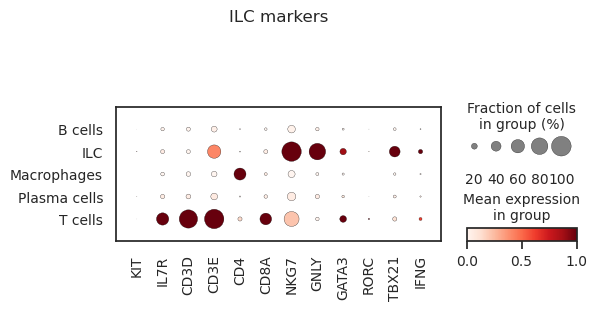

In [227]:
import scanpy as sc

# 人类 ILC 经典标记基因（用来判断注释是否正确）
ilc_markers = [
    'KIT', 'IL7R', 'CD3D', 'CD3E', 'CD4', 'CD8A',
    'NKG7', 'GNLY', 'GATA3',
    'RORC', 'TBX21', 'IFNG'
]

# 绘制 ILC 标记基因点图（按 cell_type 分组）
sc.pl.dotplot(
    hu_annot,          # 你的注释 adata
    var_names=ilc_markers,  # 标记基因
    groupby='cell_type',   # 必须加！按细胞类型分组
    standard_scale='var',
    title='ILC markers'
)

/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'nor

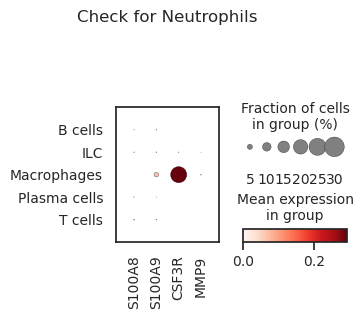

In [229]:
neutrophil_markers = ['S100A8', 'S100A9', 'CSF3R', 'MMP9']

# 画点图验证
sc.pl.dotplot(
    hu_annot, 
    var_names=neutrophil_markers, 
    groupby='cell_type',
    title='Check for Neutrophils'
)

In [233]:
# 细胞类型 -> 对应标记基因（完全按你这张图整理）
cell_type_markers = {
    "B cell": ["CD19", "CD79B", "PAX5"],
    "T cell": ["CD3D", "CD8A", "ITK", "TCF7"],
    "macrophage": ["CD68", "C1QC", "CSF1R"],
    "neutrophil": ["FCGR3A", "ADAM8"],
    "plasma": ["IGHG3", "PPIB", "IRF4", "XBP1"]
}

/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'nor

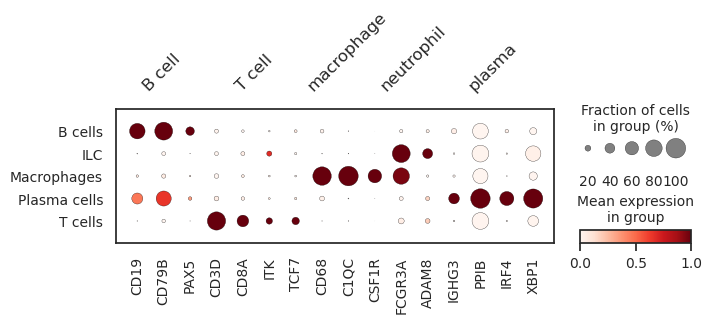

In [250]:
sc.pl.dotplot(
    hu_annot,
    var_names=cell_type_markers,  # 传入字典自动分组
    groupby="cell_type",
    standard_scale="var",
    var_group_rotation=45,
    save="_human_markers.svg"
)

In [253]:
nk_neu_markers = {
    "NK_cell": ["NKG7", "GNLY", "FGFBP2", "KLRD1", "GZMA", "GZMB"],
    "Neutrophil": ["S100A8", "S100A9", "CSF3R", "MMP9", "ADAM8"]
}

/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/public/workspace/lhpeng/miniconda3/envs/SAMap/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'nor

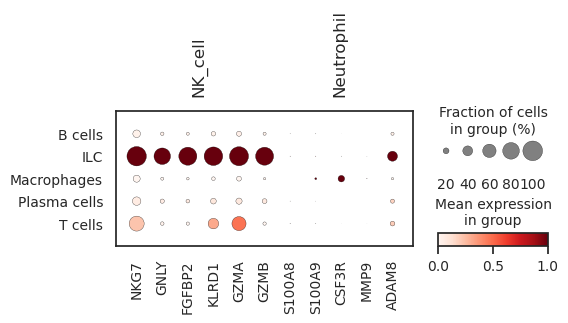

In [255]:
sc.pl.dotplot(
    hu_annot,
    var_names=nk_neu_markers,
    groupby="cell_type",
    standard_scale="var",
    save='_human_nk_neu.svg'
)

In [103]:
ilc_markers = {
    # 总 ILC 谱系（Lin- 通用）
    "ILC_common": [
        "IL7R", "ID2", "KLRB1"
    ],

    # Group1 ILC
    "NK_cell": [
        "NCAM1", "FCGR3A", "NKG7", "GNLY", "PRF1",
        "GZMA", "GZMB", "EOMES", "TBX21", "KLRD1"
    ],
    "ILC1": [
        "TBX21", "IL7R", "ITGA1", "CXCR6", "IFNG", "RGS1", "LTB"
    ],

    # Group2 ILC
    "ILC2": [
        "GATA3", "PTGDR2", "IL7R", "KLRG1", "ICOS"
    ],

    # Group3 ILC
    "ILC3": [
        "RORC", "KIT", "IL7R", "CCR6", "AHR"
    ]
}

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


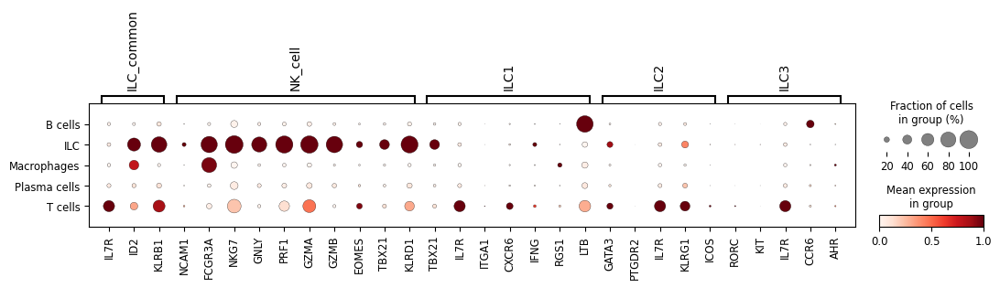

In [104]:
sc.pl.dotplot(
    adata,
    var_names=ilc_markers,
    groupby="cell_type",
    standard_scale="var",
    save='_human_ilc.svg'
)

In [105]:
adata.obs['cell_type'] = adata.obs['cell_type'].astype(str).replace('ILC', 'NK cells')

In [108]:
adata.obs['cell_type'] = adata.obs['cell_type'].astype(str).replace('NK cell', 'NK cells')

In [109]:
adata.obs['cell_type'].value_counts()

cell_type
T cells         4947
B cells         4582
NK cells        3631
Plasma cells     750
Macrophages      208
Name: count, dtype: int64

In [111]:
adata.write_h5ad("human_annot.h5ad")

## plot

In [82]:
import scanpy as sc
import matplotlib.pyplot as plt

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [83]:
sc.pp.scale(adata, max_value=10)

sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


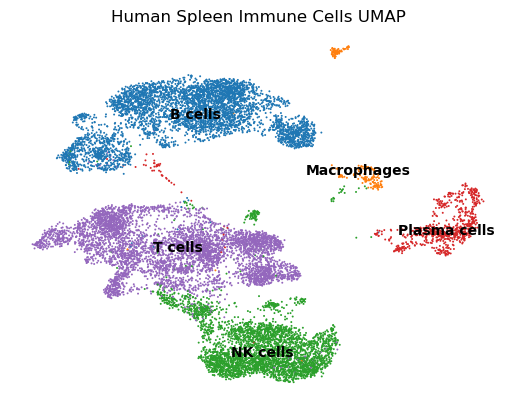

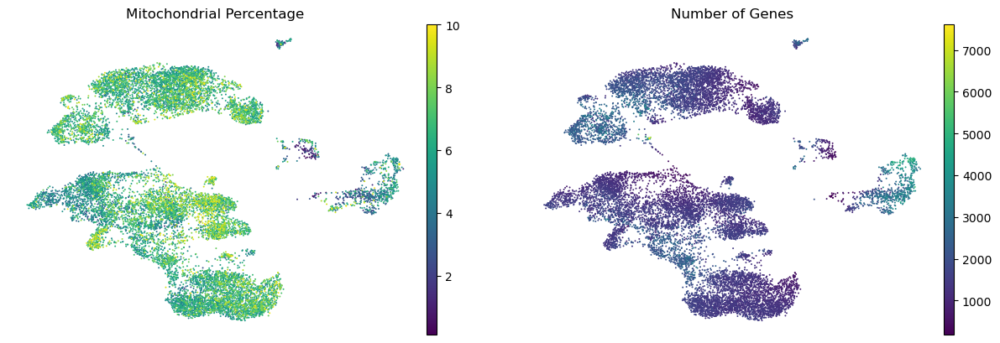

<Figure size 640x480 with 0 Axes>

In [110]:
# 绘制优化版UMAP
sc.pl.umap(
    adata,
    color='cell_type',
    title='Human Spleen Immune Cells UMAP',
    size=8,  # 点大小，根据细胞数调整（14k细胞用8-12合适）
    legend_loc='on data',
    frameon=False,  # 去掉边框，更美观
    save='_human_celltypist.svg'  # 如需保存，改为 'umap_celltype.pdf'
)

# 可选：同时展示线粒体比例/基因数等质控指标
sc.pl.umap(
    adata,
    color=['pct_counts_mt', 'n_genes'],
    title=['Mitochondrial Percentage', 'Number of Genes'],
    size=8,
    cmap='viridis',
    frameon=False
)
plt.tight_layout()
plt.show()

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


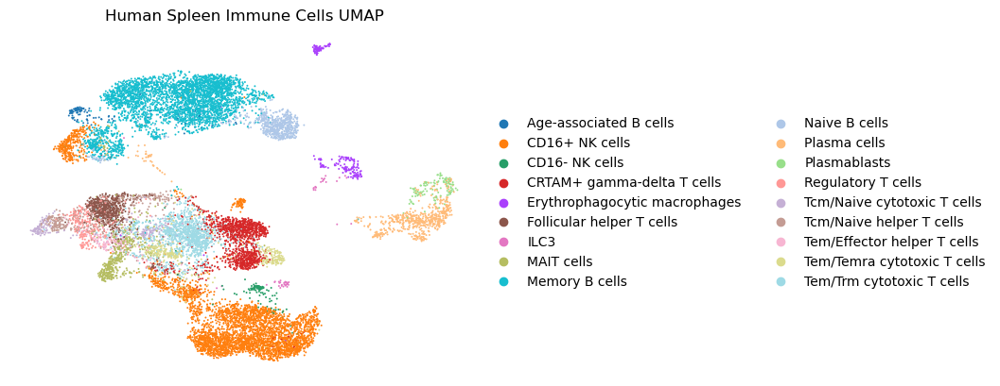

In [97]:
sc.pl.umap(
    adata,
    color='sub_cell_type',
    title='Human Spleen Immune Cells UMAP',
    size=8,  # 点大小，根据细胞数调整（14k细胞用8-12合适）
    frameon=False,  # 去掉边框，更美观
    save='_human_celltypist_sub.svg'  # 如需保存，改为 'umap_celltype.pdf'
)

# Mouse

## celltypist注释

In [2]:
import scanpy as sc
adata = sc.read_h5ad("/public/workspace/lhpeng/TACMAN/data/GSE186158/mouse_qc.h5ad")

In [3]:
# 深拷贝原始数据，避免修改输入数据
adata_annot = adata.copy()
    
# 数据预处理（CellTypist必需步骤）
# 步骤1：CPM归一化（标准化到每个细胞10000 counts）
sc.pp.normalize_total(adata_annot, target_sum=1e4)
    
# 步骤2：log1p转换（CellTypist必须）
sc.pp.log1p(adata_annot)

In [16]:
adata_annot

AnnData object with n_obs × n_vars = 13409 × 15293
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'umi_gene_ratio'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'
    uns: 'log1p', 'neighbors', 'leiden'
    obsm: 'X_pca'
    obsp: 'connectivities', 'distances'

In [4]:
import celltypist
from celltypist import models

model_high = models.Model.load(model='Immune_All_High.pkl')
    
# 细胞类型注释（开启majority_voting提升准确性）
predictions_high = celltypist.annotate(
    adata_annot,
    model=model_high,
    majority_voting=True
    )

🔬 Input data has 13409 cells and 15293 genes
🔗 Matching reference genes in the model
🧬 4 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
2026-03-24 16:14:02.957682: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [7]:
predictions_high.predicted_labels

,predicted_labels,over_clustering,majority_voting
AAACCTGAGACCACGA-1,T cells,95,T cells
AAACCTGAGACTCGGA-1,T cells,2,T cells
AAACCTGAGATGTCGG-1,T cells,12,T cells
AAACCTGAGCAAATCA-1,T cells,59,T cells
AAACCTGAGTCGAGTG-1,T cells,16,T cells
...,...,...,...
TTTGTCATCCCAGGTG-1,T cells,0,T cells
TTTGTCATCCCGGATG-1,T cells,44,T cells
TTTGTCATCGAGAGCA-1,T cells,90,T cells
TTTGTCATCTGCCCTA-1,T cells,26,T cells


In [22]:
predictions_high.predicted_labels["predicted_labels"].value_counts()

predicted_labels
T cells    13409
Name: count, dtype: int64

In [21]:
predictions_high.predicted_labels["majority_voting"].value_counts()

majority_voting
T cells    13409
Name: count, dtype: int64

In [17]:
# 加载高分辨率免疫细胞模型
model_low = models.Model.load(model='Immune_All_Low.pkl')
    
# 细分细胞类型注释
predictions_low = celltypist.annotate(
    adata_annot,
    model=model_low,
    majority_voting=True
    )

🔬 Input data has 13409 cells and 15293 genes
🔗 Matching reference genes in the model
🧬 4 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [20]:
predictions_low.predicted_labels["majority_voting"].value_counts()

majority_voting
Double-positive thymocytes    13409
Name: count, dtype: int64

In [25]:
adata_annot.obs["sub_cell_type"] = predictions_low.predicted_labels.majority_voting.values

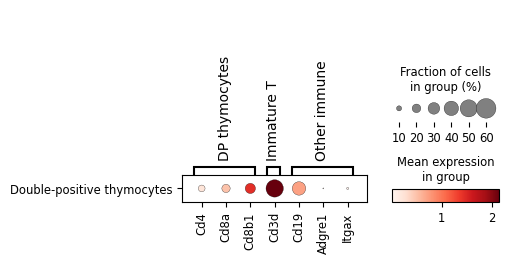

In [27]:
# 小鼠 DP T 细胞经典 Marker：Cd4 + Cd8a + Cd8b1 + Tcrb 低表达
markers = {
    "DP thymocytes": ["Cd4", "Cd8a", "Cd8b1"],
    "Immature T": ["Cd3d"],
    "Other immune": ["Cd19", "Adgre1", "Itgax"]
}
sc.pl.dotplot(adata_annot, var_names=markers, groupby='sub_cell_type')

## 手动marker注释

In [118]:
import scanpy as sc
adata = sc.read_h5ad("/public/workspace/lhpeng/TACMAN/data/GSE186158/mouse_qc.h5ad")

In [119]:
adata

AnnData object with n_obs × n_vars = 13409 × 15293
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'umi_gene_ratio'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'

In [120]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [121]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata.raw = adata  # 保存标准化后的数据
adata = adata[:, adata.var.highly_variable]  # 仅使用高变基因

## 没做scale

In [31]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [32]:
sc.tl.leiden(adata, resolution=0.5)  # 聚类
sc.tl.umap(adata)

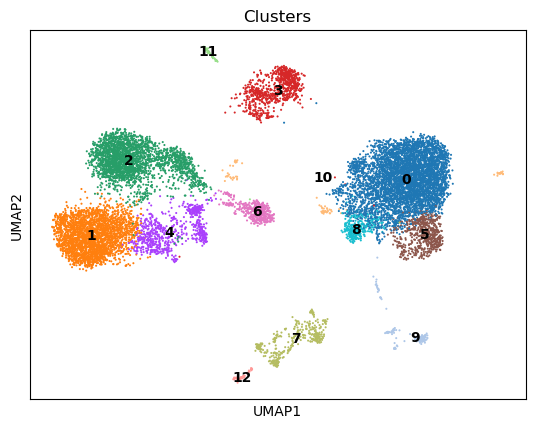

In [33]:
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data')

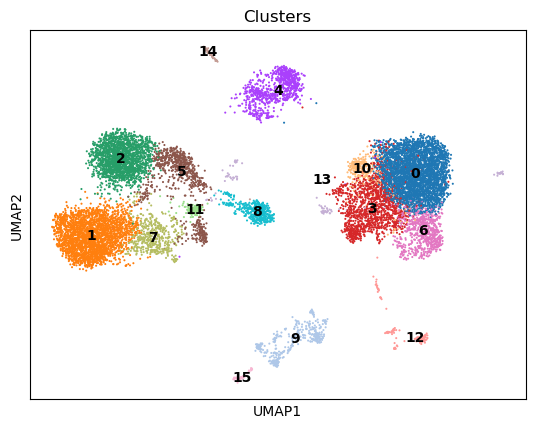

In [34]:
sc.tl.leiden(adata)  # 聚类
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data')

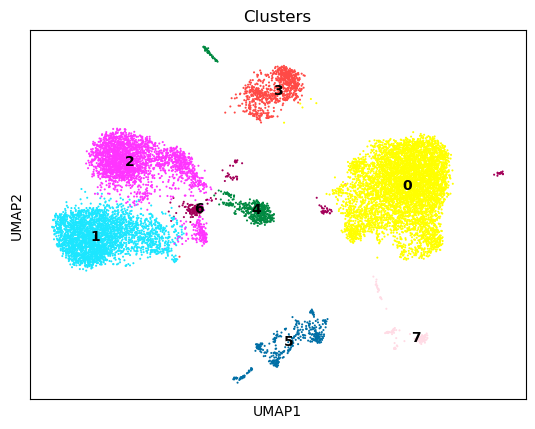

In [36]:
sc.tl.leiden(adata, resolution=0.2)  # 聚类
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data')

## scale

In [122]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


### leiden

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


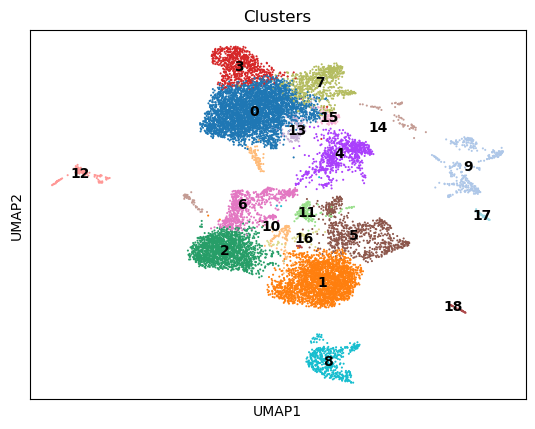

In [124]:
sc.tl.leiden(adata, resolution=0.5)  # 聚类
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data', save='_mouse_0.5.svg')

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


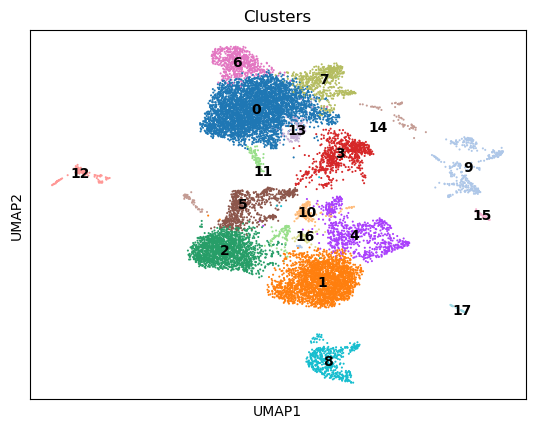

In [126]:
sc.tl.leiden(adata, resolution=0.4)  # 聚类
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data', save='_mouse_0.4.svg')

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


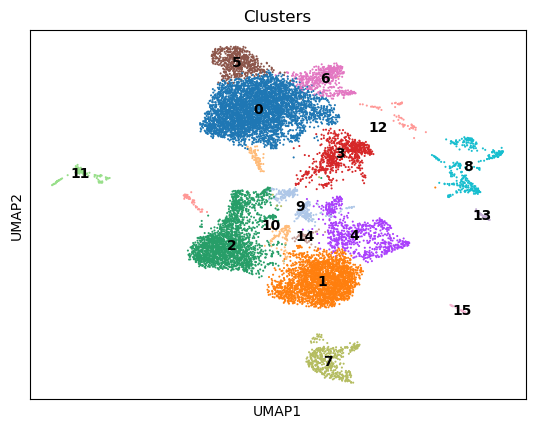

In [154]:
sc.tl.leiden(adata, resolution=0.3)  # 聚类
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data', save='_mouse_0.3.svg')

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


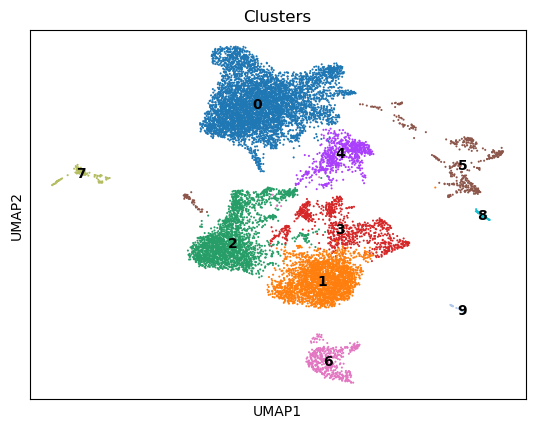

In [128]:
sc.tl.leiden(adata, resolution=0.2)  # 聚类
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data', save='_mouse_0.2.svg')

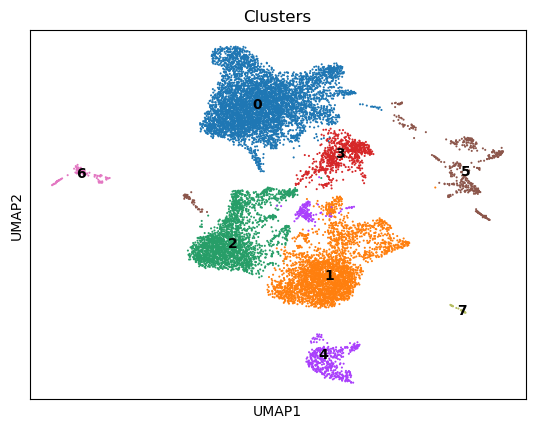

In [45]:
sc.tl.leiden(adata, resolution=0.1)  # 聚类
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data')

In [ ]:
sc.tl.leiden(adata, resolution=0.05)  # 聚类
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Clusters', legend_loc='on data')

### 差异表达分析与Marker基因鉴定

In [155]:
sc.tl.rank_genes_groups(
    adata, 
    'leiden', 
    method='wilcoxon',
    use_raw=True,  # ！！！关键：使用保存在 .raw 中的完整基因矩阵
    layer=None,
    groups='all',
    reference='rest',
    n_genes=50
)

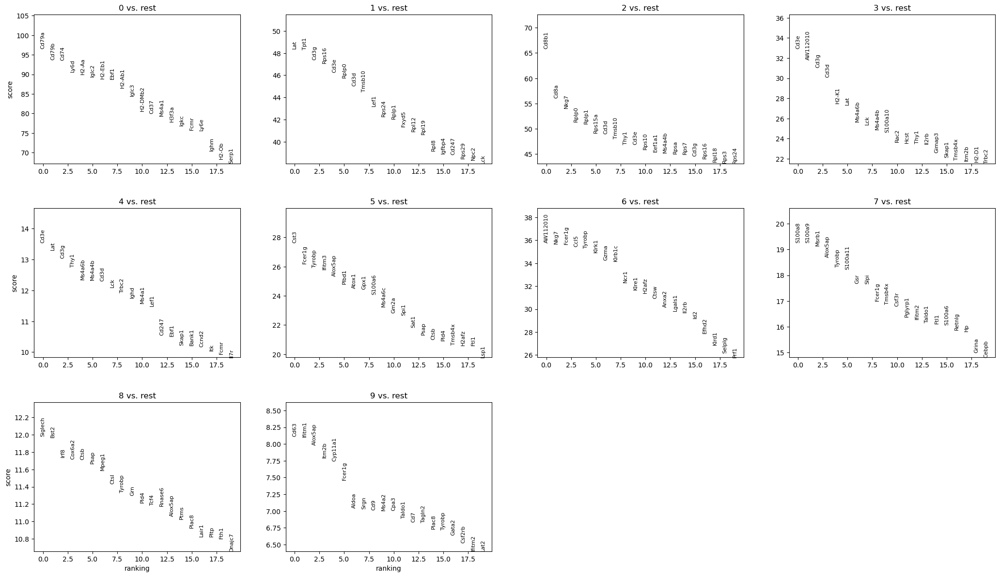

In [153]:
# 可视化每个聚类的top marker基因
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False, save='_mouse.svg')

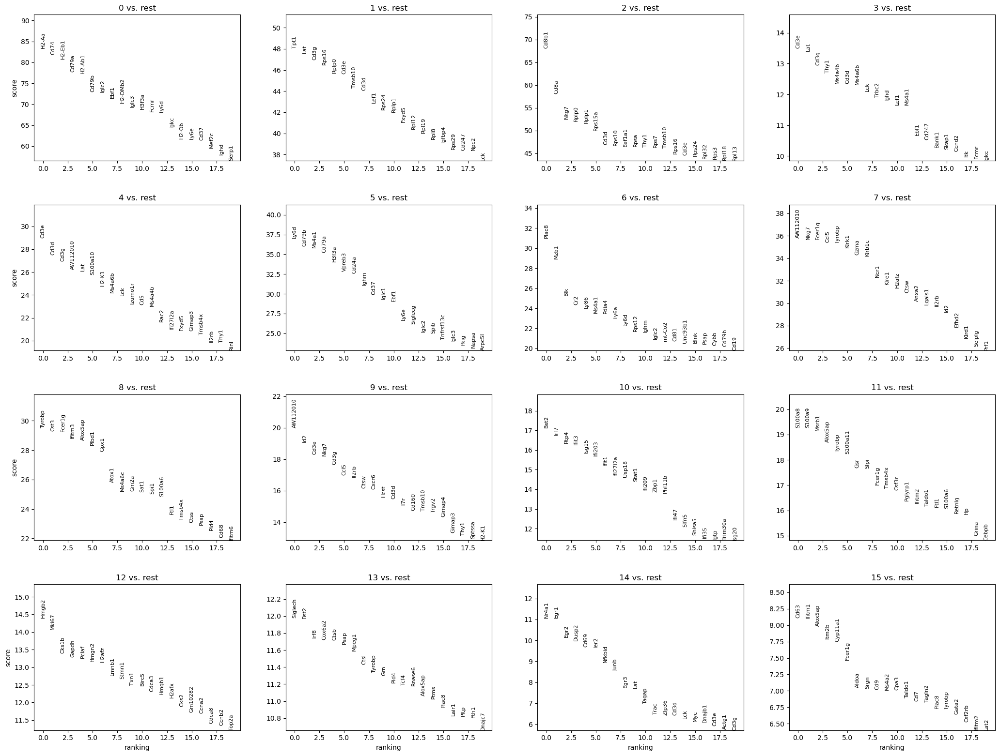

In [159]:
# 可视化每个聚类的top marker基因
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False, save='_mouse_0.3.svg')

### 基于Marker基因的手动注释

In [125]:
immune_markers = {
    'T cells': ['Cd3d', 'Cd3e', 'Cd3g', 'Cd4', 'Cd8a', 'Cd8b1'],
    'B cells': ['Cd19', 'Ms4a1', 'Cd79a', 'Cd79b', 'Ighm'],
    'Plasma cells': ['Sdc1', 'Prdm1', 'Xbp1', 'Jchain'],
    'NK cells': ['Nkg7', 'Klrd1', 'Klrc1', 'Gzma', 'Gzmb'],
    'Monocytes': ['Cd14', 'Fcgr1', 'Csf1r'],
    'Macrophages': ['Cd68', 'Adgre1', 'C1qa', 'C1qb'],
    'Dendritic cells': ['Itgax', 'Cd209a', 'Flt3', 'Clec9a'],
    'Neutrophils': ['S100a8', 'S100a9', 'Cxcr2']
}

In [145]:
immune_markers = {
    "T cells": ["Cd3d", "Cd3e", "Cd3g", "Cd4", "Cd8a", "Cd8b1", "Lck", "Itk", "Tcf7"],
    "B cells": ["Cd19", "Ms4a1", "Cd79a", "Cd79b", "Ighm", "Cd74", "Pax5"],
    "Plasma cells": ["Sdc1", "Prdm1", "Xbp1", "Jchain"],
    "NK cells": ["Nkg7", "Klrd1", "Klrc1", "Gzma", "Gzmb", "Itga2", "Fos", "Zeb2"],
    "Monocytes": ["Cd14", "Fcgr1", "Csf1r", "Cd33"],
}

In [147]:
immune_markers = {
    "Macrophages": ["Cd68", "Adgre1", "C1qa", "C1qb"],
    "Macrophages 1 (Mc1)": ["Csf1r", "Cd163", "Cd63", "C1qc"],
    "Macrophages 2 (Mc2)": ["Cd68", "Xbp1", "Irf4"],
    "Neutrophils": ["S100a8", "S100a9", "Cxcr2"],
    "Dendritic cells": ["Itgax", "Cd209a", "Flt3", "Clec9a"]
}

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


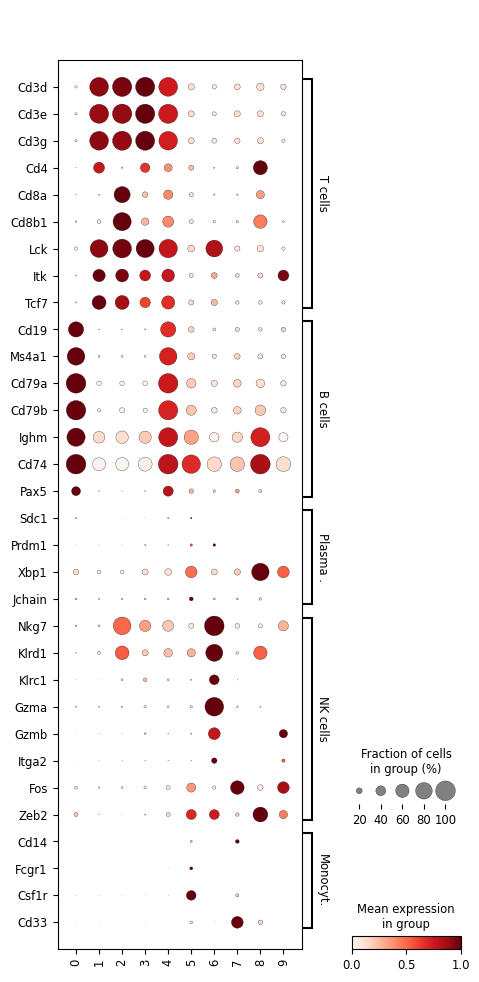

In [146]:
# 使用 .raw 中的数据绘制点图或小提琴图
sc.pl.dotplot(
    adata, 
    immune_markers,
    groupby='leiden',
    use_raw=True,  # ！！！关键：使用完整数据可视化表达量
    standard_scale='var',  # 按基因标准化表达，便于比较
    swap_axes=True
)

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


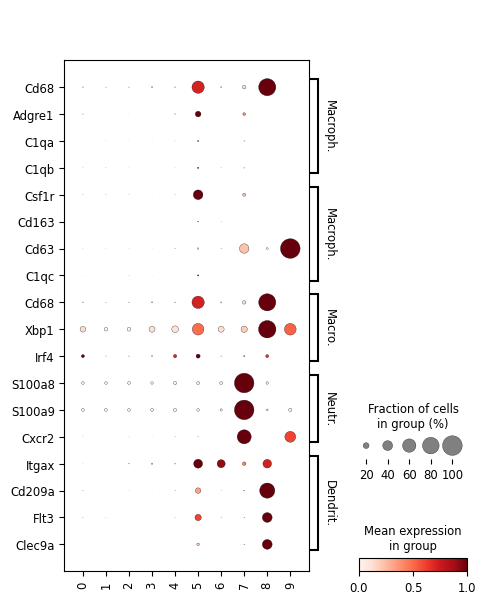

In [148]:
# 使用 .raw 中的数据绘制点图或小提琴图
sc.pl.dotplot(
    adata, 
    immune_markers,
    groupby='leiden',
    use_raw=True,  # ！！！关键：使用完整数据可视化表达量
    standard_scale='var',  # 按基因标准化表达，便于比较
    swap_axes=True
)

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


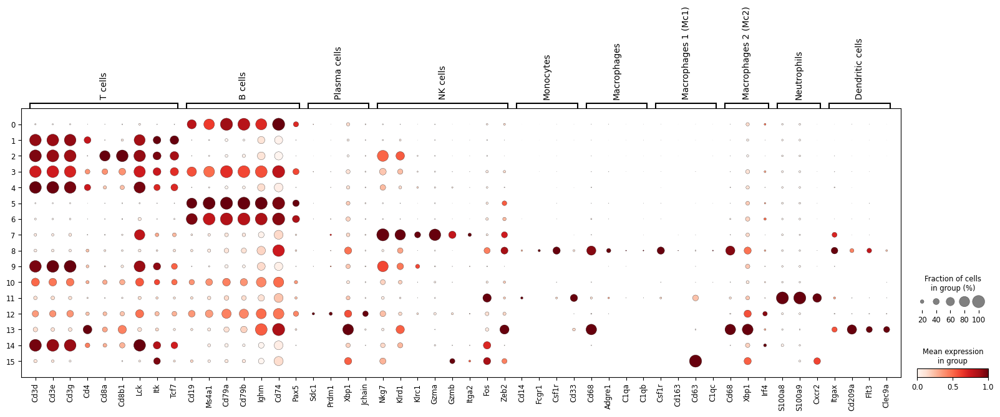

In [168]:
# 使用 .raw 中的数据绘制点图或小提琴图
sc.pl.dotplot(
    adata, 
    immune_markers,
    groupby='leiden',
    use_raw=True,  # ！！！关键：使用完整数据可视化表达量
    standard_scale='var',  # 按基因标准化表达，便于比较
    save='_mouse_0.3.svg'
)

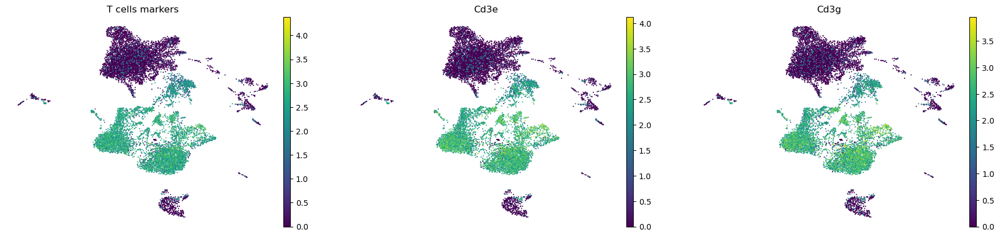

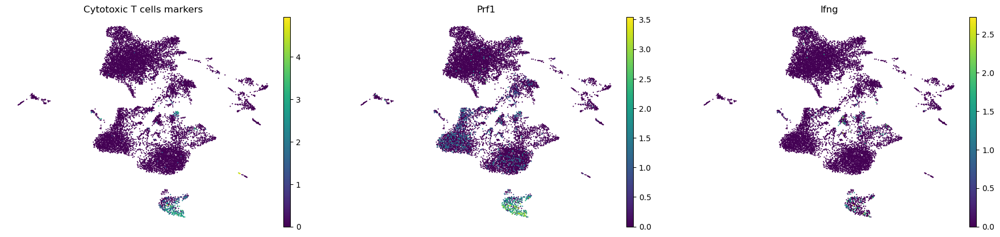

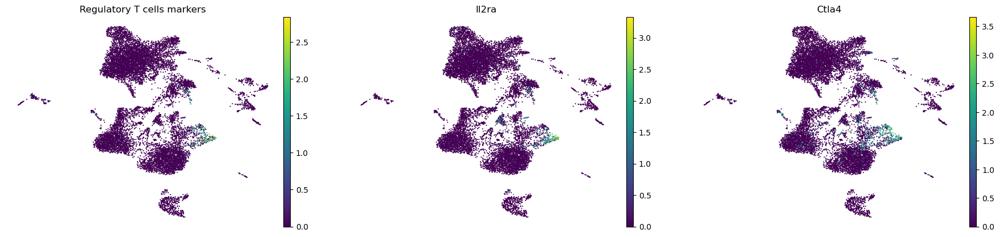

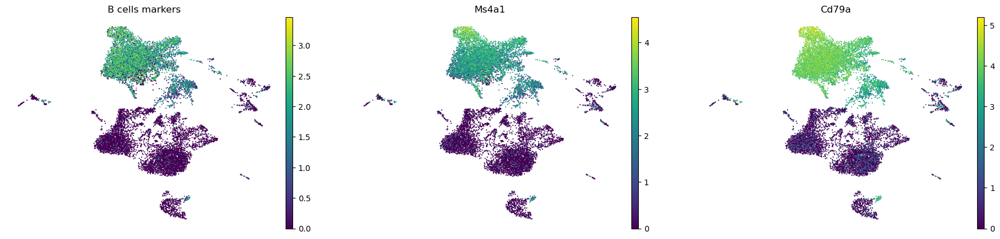

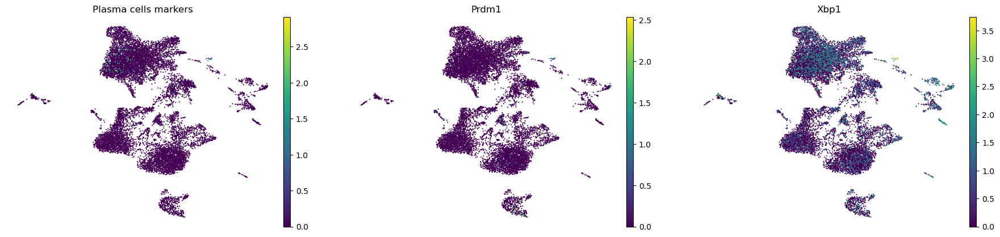

...

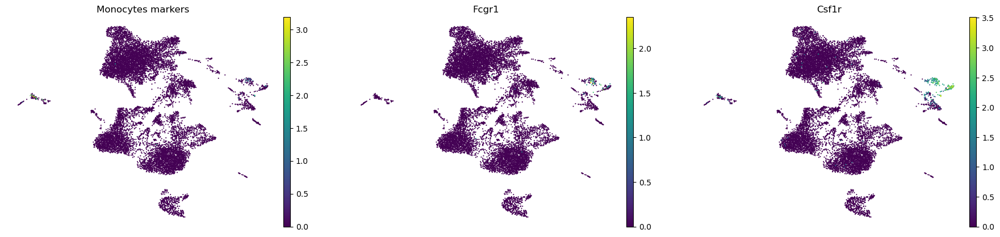

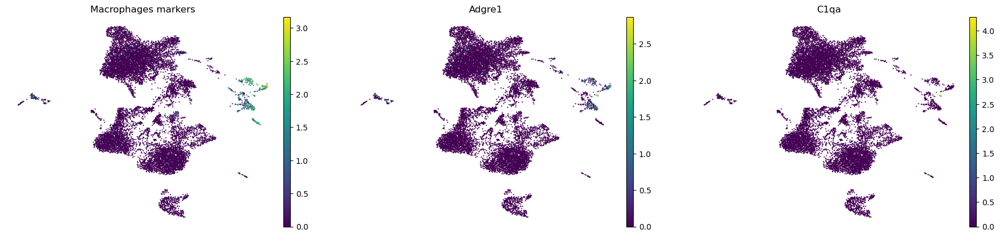

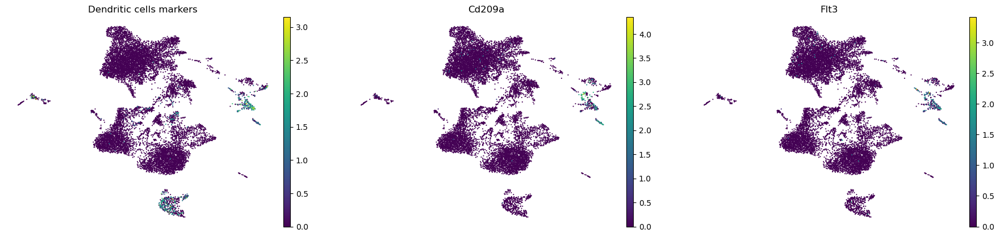

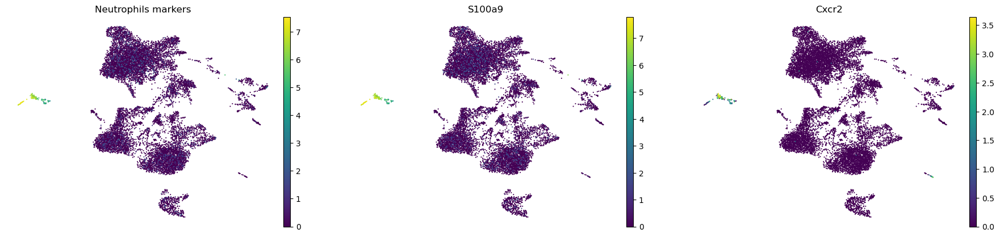

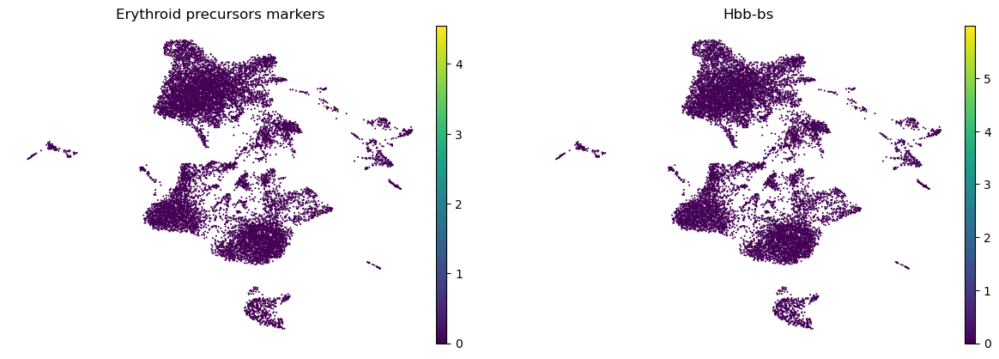

In [56]:
# 可视化Marker基因在UMAP上的表达
for cell_type, markers in immune_markers.items():
    # 只绘制在该数据集中存在的基因
    existing_markers = [m for m in markers if m in adata.var_names]
    if len(existing_markers) > 0:
        sc.pl.umap(
            adata, 
            color=existing_markers[:3],  # 每个类型画前3个marker
            ncols=min(3, len(existing_markers)),
            frameon=False,
            title=f'{cell_type} markers'
        )

## 系统化注释与验证

In [165]:
immune_markers = {
    "T cells": ["Cd3d", "Cd3e", "Cd3g", "Cd4", "Cd8a", "Cd8b1", "Lck", "Itk", "Tcf7"],
    "B cells": ["Cd19", "Ms4a1", "Cd79a", "Cd79b", "Ighm", "Cd74", "Pax5"],
    "Plasma cells": ["Sdc1", "Prdm1", "Xbp1", "Jchain"],
    "NK cells": ["Nkg7", "Klrd1", "Klrc1", "Gzma", "Gzmb", "Itga2", "Fos", "Zeb2"],
    "Monocytes": ["Cd14", "Fcgr1", "Csf1r", "Cd33"],
    "Macrophages": ["Cd68", "Adgre1", "C1qa", "C1qb"],
    "Macrophages 1 (Mc1)": ["Csf1r", "Cd163", "Cd63", "C1qc"],
    "Macrophages 2 (Mc2)": ["Cd68", "Xbp1", "Irf4"],
    "Neutrophils": ["S100a8", "S100a9", "Cxcr2"],
    "Dendritic cells": ["Itgax", "Cd209a", "Flt3", "Clec9a"]
}


--- 聚类 0 ---
Top DE 基因: ['Cd79a', 'Cd79b', 'Cd74', 'Ly6d', 'H2-Aa', 'Iglc2', 'H2-Eb1', 'Ebf1', 'H2-Ab1', 'Iglc3']
标记基因平均表达: {'T cells': 0.059827115, 'B cells': 2.6514812, 'Plasma cells': 0.10371755, 'NK cells': 0.05468578, 'Monocytes': 0.13129368, 'Macrophages': 0.006590287, 'Macrophages 1 (Mc1)': 0.001945024, 'Macrophages 2 (Mc2)': 0.40945628, 'Neutrophils': 0.08934673, 'Dendritic cells': 0.0037477724}

--- 聚类 1 ---
Top DE 基因: ['Lat', 'Tpt1', 'Cd3g', 'Rps16', 'Cd3e', 'Rplp0', 'Cd3d', 'Tmsb10', 'Lef1', 'Rps24']
标记基因平均表达: {'T cells': 1.2587246, 'B cells': 0.3150523, 'Plasma cells': 0.052312277, 'NK cells': 0.03472494, 'Monocytes': 0.11160719, 'Macrophages': 0.0031166538, 'Macrophages 1 (Mc1)': 0.0015782027, 'Macrophages 2 (Mc2)': 0.35725254, 'Neutrophils': 0.049642272, 'Dendritic cells': 0.0010197932}

--- 聚类 2 ---
Top DE 基因: ['Cd8b1', 'Cd8a', 'Nkg7', 'Rplp0', 'Rplp1', 'Rps15a', 'Cd3d', 'Tmsb10', 'Thy1', 'Cd3e']
标记基因平均表达: {'T cells': 1.5785471, 'B cells': 0.30901355, 'Plasma cells': 0.

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


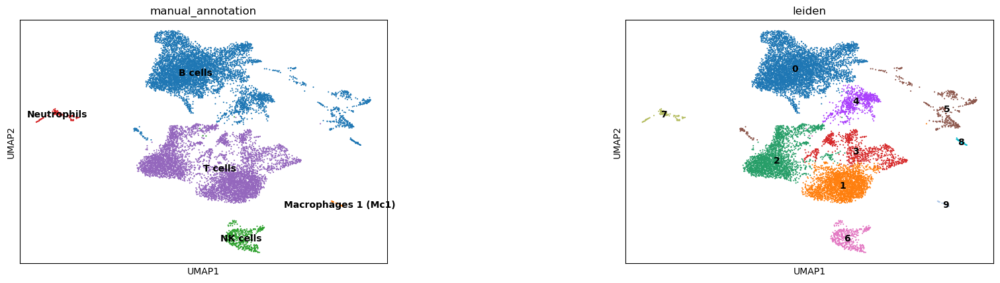

In [151]:
import pandas as pd

# 步骤C：基于表达模式的系统化注释
annotation_dict = {}
for cluster in sorted(adata.obs['leiden'].cat.categories):
    # 获取该聚类差异表达最显著的Top基因
    de_genes = pd.DataFrame(adata.uns['rank_genes_groups']['names']).iloc[:, int(cluster)].head(10).tolist()
    
    # 检查已知标记基因在该聚类中的平均表达（从 .raw 中获取表达矩阵）
    cluster_cell_idx = adata.obs['leiden'] == cluster
    # 注意：这里从 adata.raw 获取表达矩阵
    raw_data_for_cluster = adata.raw[cluster_cell_idx, :]
    
    expression_scores = {}
    for cell_type, markers in immune_markers.items(): # 复用之前定义的免疫细胞标记字典
        existing = [m for m in markers if m in adata.raw.var_names]
        if existing:
            # 计算这些标记基因在该聚类中的平均表达（log1p后的值）
            mean_expr = raw_data_for_cluster[:, existing].X.mean(axis=0).mean()
            expression_scores[cell_type] = mean_expr
    
    # 结合Top DE基因和已知标记基因表达进行判断
    print(f"\n--- 聚类 {cluster} ---")
    print(f"Top DE 基因: {de_genes}")
    print(f"标记基因平均表达: {expression_scores}")
    
    # 一个简单的启发式规则：如果某个细胞类型的标记基因平均表达显著高于其他类型，则分配该类型
    if expression_scores:
        predicted_type = max(expression_scores, key=expression_scores.get)
        if expression_scores[predicted_type] > 0.6:  # 阈值可根据数据调整
            annotation_dict[cluster] = predicted_type
        else:
            annotation_dict[cluster] = 'Unknown'
    else:
        annotation_dict[cluster] = 'Unknown'

# 将注释添加到观察数据中
adata.obs['manual_annotation'] = adata.obs['leiden'].map(annotation_dict)

# 可视化最终注释结果
sc.pl.umap(adata, color=['manual_annotation', 'leiden'], wspace=0.5, legend_loc='on data')


--- 聚类 0 ---
Top DE 基因: ['H2-Aa', 'Cd74', 'H2-Eb1', 'Cd79a', 'H2-Ab1', 'Cd79b', 'Iglc2', 'Ebf1', 'H2-DMb2', 'Iglc3']
标记基因平均表达: {'T cells': 0.057418033, 'B cells': 2.5936856, 'Plasma cells': 0.09462116, 'NK cells': 0.04687579, 'Monocytes': 0.001622372, 'Macrophages': 0.0056224377, 'Macrophages 1 (Mc1)': 0.0017675073, 'Macrophages 2 (Mc2)': 0.14090134, 'Neutrophils': 0.080332555, 'Dendritic cells': 0.0037669302}

--- 聚类 1 ---
Top DE 基因: ['Tpt1', 'Lat', 'Cd3g', 'Rps16', 'Rplp0', 'Cd3e', 'Tmsb10', 'Cd3d', 'Lef1', 'Rps24']
标记基因平均表达: {'T cells': 1.2611299, 'B cells': 0.31225428, 'Plasma cells': 0.046440277, 'NK cells': 0.03446386, 'Monocytes': 0.0016372886, 'Macrophages': 0.0032098815, 'Macrophages 1 (Mc1)': 0.001625411, 'Macrophages 2 (Mc2)': 0.052107915, 'Neutrophils': 0.067371406, 'Dendritic cells': 0.001050298}

--- 聚类 10 ---
Top DE 基因: ['Bst2', 'Irf7', 'Rtp4', 'Ifit3', 'Isg15', 'Ifi203', 'Ifit1', 'Ifi27l2a', 'Usp18', 'Stat1']
标记基因平均表达: {'T cells': 0.8104237, 'B cells': 1.4357215, 'Plas

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


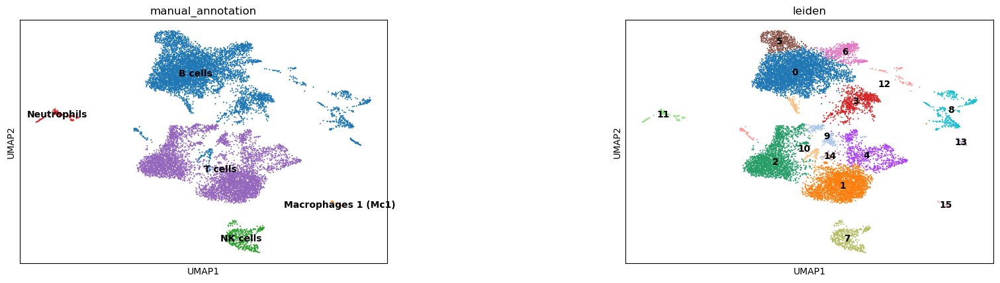

In [167]:
import pandas as pd

# 步骤C：基于表达模式的系统化注释
annotation_dict = {}
for cluster in sorted(adata.obs['leiden'].cat.categories):
    # 获取该聚类差异表达最显著的Top基因
    de_genes = pd.DataFrame(adata.uns['rank_genes_groups']['names']).iloc[:, int(cluster)].head(10).tolist()
    
    # 检查已知标记基因在该聚类中的平均表达（从 .raw 中获取表达矩阵）
    cluster_cell_idx = adata.obs['leiden'] == cluster
    # 注意：这里从 adata.raw 获取表达矩阵
    raw_data_for_cluster = adata.raw[cluster_cell_idx, :]
    
    expression_scores = {}
    for cell_type, markers in immune_markers.items(): # 复用之前定义的免疫细胞标记字典
        existing = [m for m in markers if m in adata.raw.var_names]
        if existing:
            # 计算这些标记基因在该聚类中的平均表达（log1p后的值）
            mean_expr = raw_data_for_cluster[:, existing].X.mean(axis=0).mean()
            expression_scores[cell_type] = mean_expr
    
    # 结合Top DE基因和已知标记基因表达进行判断
    print(f"\n--- 聚类 {cluster} ---")
    print(f"Top DE 基因: {de_genes}")
    print(f"标记基因平均表达: {expression_scores}")
    
    # 一个简单的启发式规则：如果某个细胞类型的标记基因平均表达显著高于其他类型，则分配该类型
    if expression_scores:
        predicted_type = max(expression_scores, key=expression_scores.get)
        if expression_scores[predicted_type] > 0.6:  # 阈值可根据数据调整
            annotation_dict[cluster] = predicted_type
        else:
            annotation_dict[cluster] = 'Unknown'
    else:
        annotation_dict[cluster] = 'Unknown'

# 将注释添加到观察数据中
adata.obs['manual_annotation'] = adata.obs['leiden'].map(annotation_dict)

# 可视化最终注释结果
sc.pl.umap(adata, color=['manual_annotation', 'leiden'], wspace=0.5, legend_loc='on data')

In [ ]:
#### 0.5

In [68]:
sc.tl.rank_genes_groups(
    adata, 
    'leiden', 
    method='wilcoxon',
    use_raw=True,  # ！！！关键：使用保存在 .raw 中的完整基因矩阵
    layer=None,
    groups='all',
    reference='rest',
    n_genes=50
)

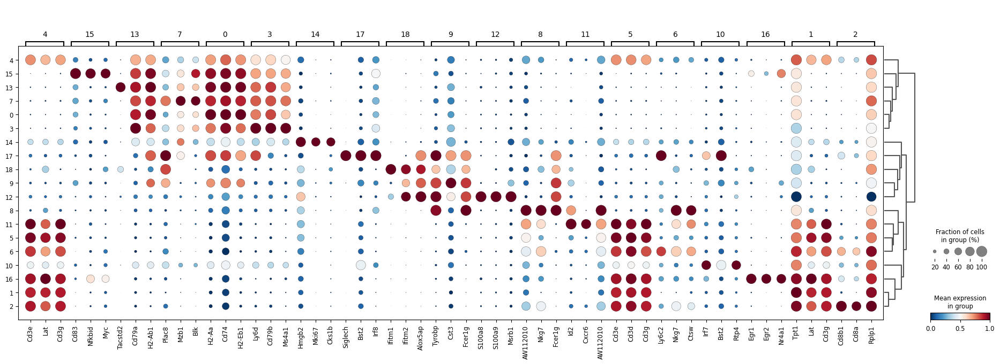

In [80]:
sc.pl.rank_genes_groups_dotplot(adata,groupby='leiden',
                                cmap='RdBu_r',
                                standard_scale='var',
                                n_genes=3,
                                save='marker.png')

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


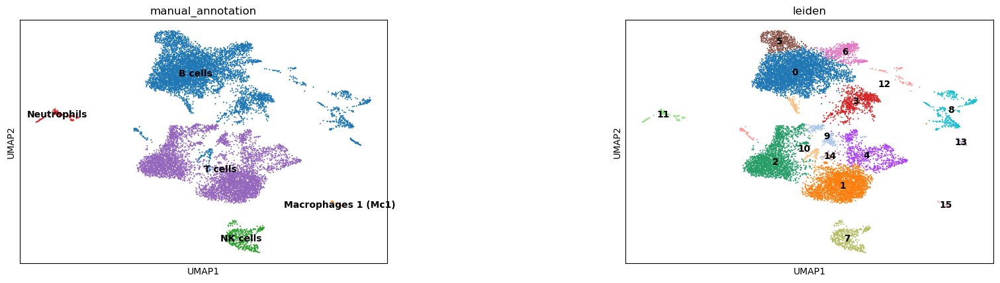

In [173]:
sc.pl.umap(adata, color=['manual_annotation', 'leiden'], wspace=0.5, legend_loc='on data',save='_mouse_0.3_cluster.svg')

In [174]:
markers = {
    "cDC": ["Itgax"],
    "cDC2 & Macrophages": ["Sirpa"],
    "cDC1": ["Xcr1"],
    "cDC2": ["Clec10a", "Clec4a4"],
    "pDC": ["Siglech", "Bst2", "Tcf4"],
    "Macrophages": ["Adgre1", "Cd163", "Mrc1", "H2-Aa"],
    "Monocytes": ["Ly6c2", "Ccr2"]
}

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


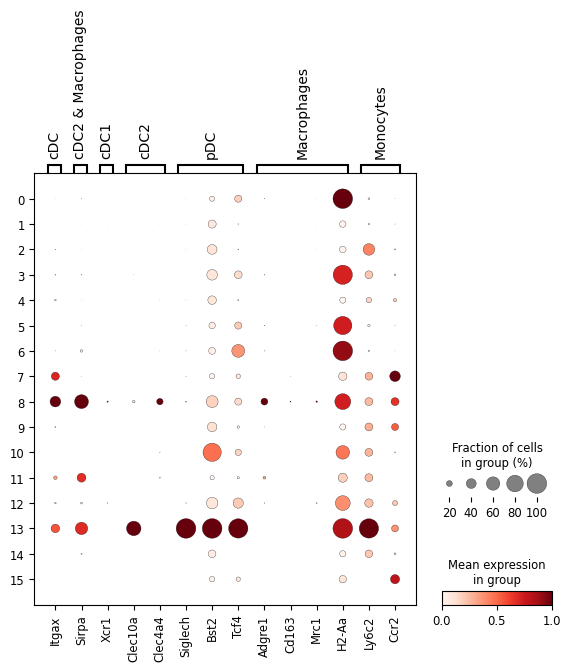

In [175]:
# 使用 .raw 中的数据绘制点图或小提琴图
sc.pl.dotplot(
    adata, 
    markers,
    groupby='leiden',
    use_raw=True,  # ！！！关键：使用完整数据可视化表达量
    standard_scale='var',  # 按基因标准化表达，便于比较
    save='_mouse_0.3_c8.svg'
)

In [194]:
mast_markers = {
    "Mast cells": ["Cpa3", "Ms4a2", "Kit", "Fcer1a", "Cd63"]
}# 小鼠
# 对应人类标记可能为：["CPA3", "MS4A2", "KIT", "FCER1A", "TPSAB1", "CD63"]

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


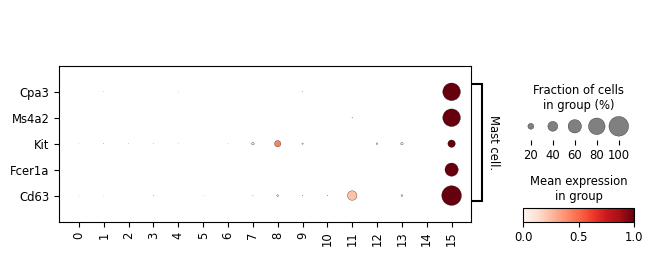

In [196]:
# 使用 .raw 中的数据绘制点图或小提琴图
sc.pl.dotplot(
    adata, 
    mast_markers,
    groupby='leiden',
    use_raw=True,  # ！！！关键：使用完整数据可视化表达量
    standard_scale='var',  # 按基因标准化表达，便于比较
    swap_axes=True,
    save='_mouse_0.3_master.svg'
)

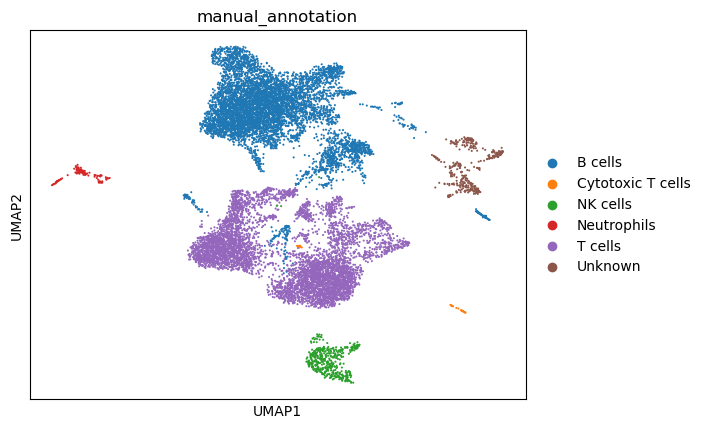

In [73]:
sc.pl.umap(adata, color=['manual_annotation'], wspace=0.5, save='_celltype_0.5')

In [75]:
adata

AnnData object with n_obs × n_vars = 13409 × 2000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'umi_gene_ratio', 'leiden', 'manual_annotation'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'manual_annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

### unknow cell

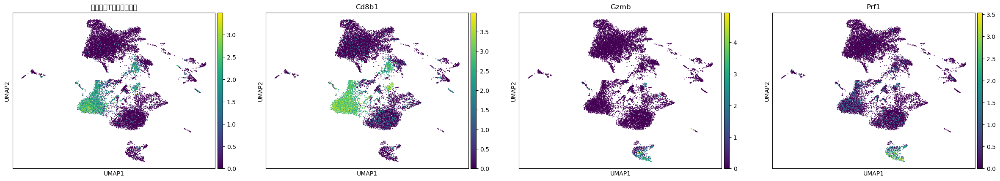

In [76]:
# 确认橙色簇确实高表达细胞毒性标记
sc.pl.umap(adata, color=['Cd8a', 'Cd8b1', 'Gzmb', 'Prf1'], 
           title='细胞毒性T细胞标记验证')

In [125]:
# 添加类别
adata.obs['manual_annotation'] = adata.obs['manual_annotation'].cat.add_categories('Macrophages')

In [94]:
# 换下面
adata.obs.loc[adata.obs['leiden'] == "9", 'manual_annotation'] = 'Dendritic cells'

In [126]:
adata.obs.loc[adata.obs['leiden'] == "9", 'manual_annotation'] = 'Macrophages'

In [118]:
mouse_mac_markers = ['Cd68', 'Cd163', 'Mertk', 'Lyz']  # 假设的小鼠同源基因
mouse_dc_markers = ['Itgax', 'Clec10a', 'Cd209a', 'Flt3']  # 假设的小鼠同源基因，Itgax即CD11c

cluster_9_data = adata[adata.obs['leiden'] == '9']
mac_expr = cluster_9_data[:, [g for g in mouse_mac_markers if g in cluster_9_data.var_names]].X.mean(axis=0).mean()
dc_expr = cluster_9_data[:, [g for g in mouse_dc_markers if g in cluster_9_data.var_names]].X.mean(axis=0).mean()

print(f"聚类9中：‘巨噬细胞核心标记’平均表达 = {mac_expr:.3f}")
print(f"聚类9中：‘树突状细胞核心标记’平均表达 = {dc_expr:.3f}")

聚类9中：‘巨噬细胞核心标记’平均表达 = 1.985
聚类9中：‘树突状细胞核心标记’平均表达 = 1.733


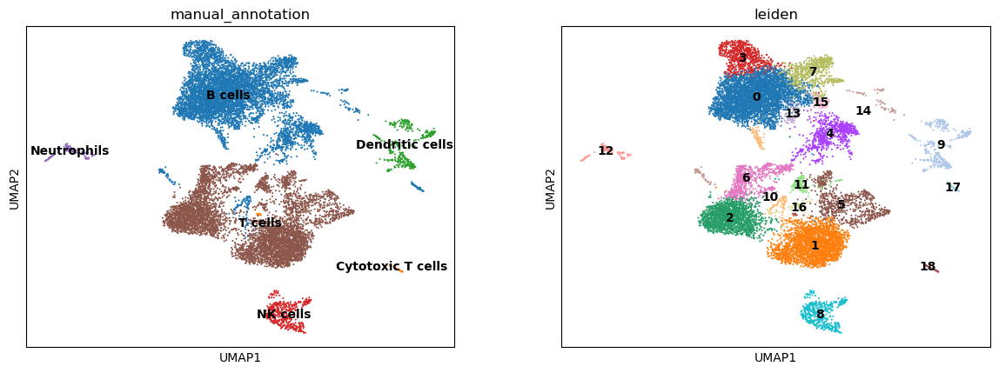

In [119]:
sc.pl.umap(adata, color=['manual_annotation', 'leiden'], legend_loc='on data')

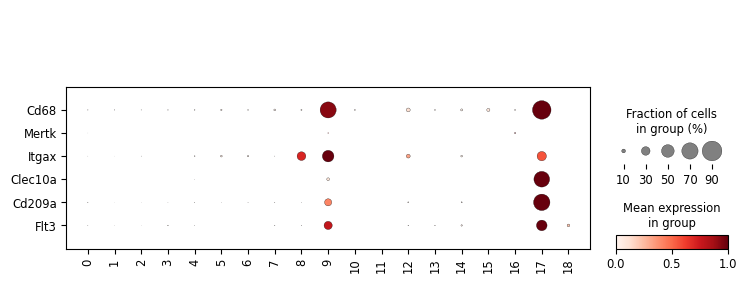

In [123]:
sc.pl.dotplot(adata, 
              var_names=[g for g in mouse_mac_markers + mouse_dc_markers if g in adata.var_names],
              groupby='leiden', 
              standard_scale='var',
              swap_axes=True,
              save='mac_dc_marker.svg')

### sub

In [97]:
cDC1_markers = ['Xcr1', 'Clec9a', 'Cd24a']
cDC2_markers = ['Sirpa', 'Cd209a', 'Fcer1g']  # Fcer1g我们已经知道它高表达
macrophage_markers = ['Adgre1', 'Cd68', 'Mertk']
# 通用DC标记，用于确认树突状细胞身份
general_DC_markers = ['Itgax', 'H2-Ab1', 'Flt3']

In [98]:
cluster_9_adata = adata[adata.obs['leiden'] == '9'].copy()

In [99]:
# 计算并打印每个标记基因集在聚类9中的平均表达
def check_marker_expression(adata_subset, marker_dict):
    for cell_subtype, markers in marker_dict.items():
        existing_markers = [m for m in markers if m in adata_subset.var_names]
        if existing_markers:
            # 计算这些标记基因的平均表达
            # 注意：这里使用原始数据 .raw
            if adata_subset.raw is not None:
                mean_expr = adata_subset.raw[:, existing_markers].X.mean(axis=0).mean()
            else:
                mean_expr = adata_subset[:, existing_markers].X.mean(axis=0).mean()
            print(f"  {cell_subtype}: 平均表达 = {mean_expr:.4f}")
        else:
            print(f"  {cell_subtype}: 无对应标记基因在数据中")

marker_dict_for_check = {
    '通用DC标记': general_DC_markers,
    'cDC1 标记': cDC1_markers,
    'cDC2 标记': cDC2_markers,
    '巨噬细胞标记': macrophage_markers
}
check_marker_expression(cluster_9_adata, marker_dict_for_check)

# 3. 基于表达模式进行逻辑判断
print(f"\n=== 亚型判断建议 ===")
# 计算各标记基因集的平均表达
expr_dict = {}
for cell_subtype, markers in marker_dict_for_check.items():
    existing_markers = [m for m in markers if m in cluster_9_adata.var_names]
    if existing_markers:
        if cluster_9_adata.raw is not None:
            expr_dict[cell_subtype] = cluster_9_adata.raw[:, existing_markers].X.mean(axis=0).mean()
        else:
            expr_dict[cell_subtype] = cluster_9_adata[:, existing_markers].X.mean(axis=0).mean()

# 提取关键值
expr_cDC1 = expr_dict.get('cDC1 标记', 0)
expr_cDC2 = expr_dict.get('cDC2 标记', 0)
expr_mac = expr_dict.get('巨噬细胞标记', 0)

# 判断逻辑
if expr_cDC2 > max(expr_cDC1, expr_mac) * 1.5:  # 示例阈值，cDC2表达显著更高
    print("  判断: 聚类9高表达cDC2标记 (Sirpa, Cd209a, Fcer1g)，建议最终注释为 cDC2。")
    final_subtype_label = 'cDC2'
elif expr_cDC1 > max(expr_cDC2, expr_mac) * 1.5:
    print("  判断: 聚类9高表达cDC1标记 (Xcr1, Clec9a)，建议最终注释为 cDC1。")
    final_subtype_label = 'cDC1'
elif expr_mac > max(expr_cDC1, expr_cDC2) * 1.5:
    print("  判断: 聚类9高表达巨噬细胞标记，虽然Top基因为DC相关，但可能为具有巨噬细胞特征的混合群体或特殊亚型。考虑注释为 'Macrophage-like DC' 或进一步检查。")
    final_subtype_label = 'Macrophage/DC Mix'  # 需谨慎决定
else:
    print("  判断: 标记基因表达模式不明确，可能为未极化或中间状态。保留为 'Dendritic cells'。")
    final_subtype_label = 'Dendritic cells'


  通用DC标记: 平均表达 = 1.1883
  cDC1 标记: 平均表达 = 0.1248
  cDC2 标记: 平均表达 = 1.4456
  巨噬细胞标记: 平均表达 = 0.5032

=== 亚型判断建议 ===
  判断: 聚类9高表达cDC2标记 (Sirpa, Cd209a, Fcer1g)，建议最终注释为 cDC2。


## 保存数据

In [103]:
adata.obs['manual_annotation'] = adata.obs['manual_annotation'].cat.remove_categories('Unknown')

In [128]:
adata.obs['manual_annotation'] = adata.obs['manual_annotation'].cat.remove_categories('Dendritic cells')

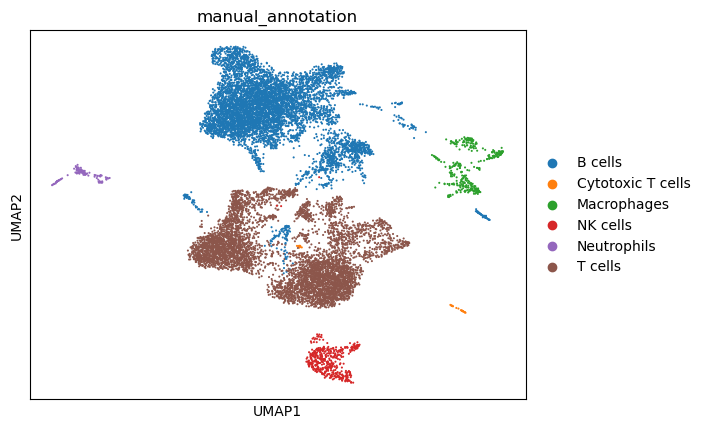

In [129]:
sc.pl.umap(adata, color=['manual_annotation'], wspace=0.5, save='_celltype3_0.5.svg')

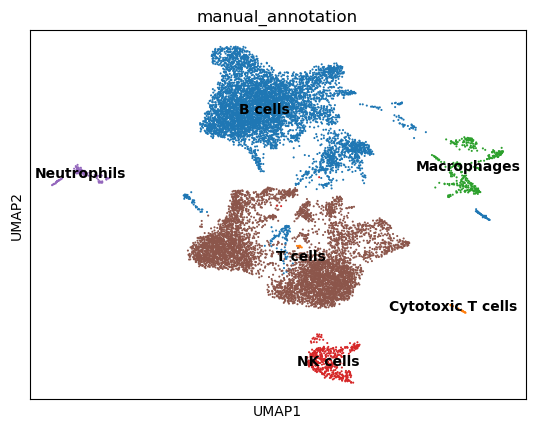

In [135]:
sc.pl.umap(adata, color='manual_annotation', legend_loc='on data', save='_celltype4_0.5.svg')

In [130]:
adata

AnnData object with n_obs × n_vars = 13409 × 2000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'umi_gene_ratio', 'leiden', 'manual_annotation', 'cell_type'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'manual_annotation_colors', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [131]:
adata.obs["manual_annotation"].value_counts()

manual_annotation
B cells              6712
T cells              5713
NK cells              466
Macrophages           360
Neutrophils           127
Cytotoxic T cells      31
Name: count, dtype: int64

In [181]:
# 先添加新类别
adata.obs["manual_annotation"] = adata.obs["manual_annotation"].cat.add_categories("Macrophages")

# 再修改 leiden=15
adata.obs.loc[adata.obs["leiden"] == "15", "manual_annotation"] = "Macrophages"

In [184]:
adata.obs["manual_annotation"].value_counts()

manual_annotation
B cells        7062
T cells        5731
NK cells        467
Neutrophils     127
Macrophages      22
Name: count, dtype: int64

In [183]:
adata.obs['manual_annotation'] = adata.obs['manual_annotation'].cat.remove_categories('Macrophages 1 (Mc1)')

In [185]:
# 先添加新类别
adata.obs["manual_annotation"] = adata.obs["manual_annotation"].cat.add_categories("Dendritic Cells")

# 再修改 leiden=15
adata.obs.loc[adata.obs["leiden"] == "13", "manual_annotation"] = "Dendritic Cells"

In [186]:
adata.obs["manual_annotation"].value_counts()

manual_annotation
B cells            7014
T cells            5731
NK cells            467
Neutrophils         127
Dendritic Cells      48
Macrophages          22
Name: count, dtype: int64

In [197]:
# 先添加新类别
adata.obs["manual_annotation"] = adata.obs["manual_annotation"].cat.add_categories("Mast Cells")

# 再修改 leiden=15
adata.obs.loc[adata.obs["leiden"] == "15", "manual_annotation"] = "Mast Cells"

In [199]:
adata.obs['manual_annotation'] = adata.obs['manual_annotation'].cat.remove_categories('Macrophages')

In [200]:
adata.obs["manual_annotation"].value_counts()

manual_annotation
B cells            7014
T cells            5731
NK cells            467
Neutrophils         127
Dendritic Cells      48
Mast Cells           22
Name: count, dtype: int64

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


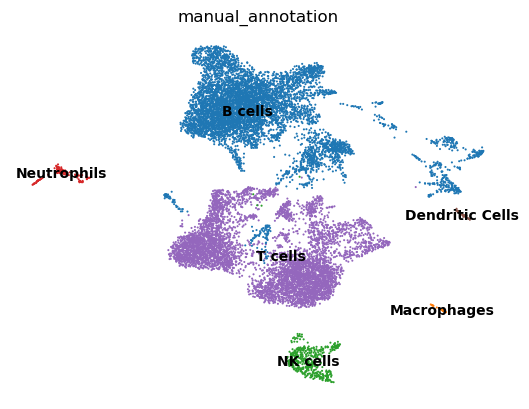

In [190]:
sc.pl.umap(adata, 
           color='manual_annotation', 
           legend_loc='on data', 
           frameon=False,
           save='_celltype_mouse_final.svg')

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


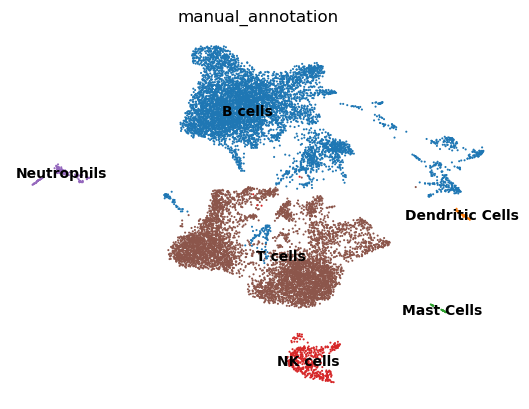

In [201]:
sc.pl.umap(adata, 
           color='manual_annotation', 
           legend_loc='on data', 
           frameon=False,
           save='_celltype_mouse_final.svg')

In [202]:
adata.obs['cell_type'] = adata.obs['manual_annotation'].copy()

In [214]:
adata.obs['cell_type'].value_counts()

cell_type
B cells            7014
T cells            5731
NK cells            467
Neutrophils         127
Dendritic Cells      48
Mast Cells           22
Name: count, dtype: int64

In [205]:
adata.write_h5ad("mouse_annot.h5ad")

In [215]:
adata_annot.obs['cell_type'] = adata.obs['manual_annotation'].copy()

In [218]:
adata_annot = sc.read_h5ad("human_annot.h5ad")

In [221]:
adata_annot.obs['cell_type'].value_counts()

cell_type
T cells         4947
B cells         4582
NK cells        3631
Plasma cells     750
Macrophages      208
Name: count, dtype: int64

# zebrafish

In [15]:
import scanpy as sc
adata = sc.read_h5ad("../TACMAN/data/GSE186158/qc_results/GSM5639492_Fish_qc.h5ad")

In [17]:
adata

AnnData object with n_obs × n_vars = 14241 × 20247
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'umi_gene_ratio'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'

In [19]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [20]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata.raw = adata  # 保存标准化后的数据
adata = adata[:, adata.var.highly_variable]  # 仅使用高变基因

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [21]:
sc.pp.scale(adata, max_value=10)

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [22]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)

2026-04-12 14:42:17.276400: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [25]:
sc.tl.leiden(adata, resolution=0.5)

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


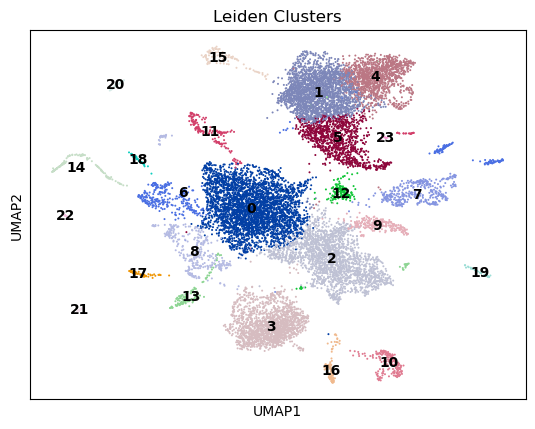

In [26]:
sc.pl.umap(adata, color='leiden', title='Leiden Clusters', legend_loc='on data')

In [30]:
adata

AnnData object with n_obs × n_vars = 14241 × 2000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'umi_gene_ratio', 'leiden', 'leiden_0.2'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [29]:
sc.tl.leiden(adata, resolution=0.2, key_added='leiden_0.2')

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


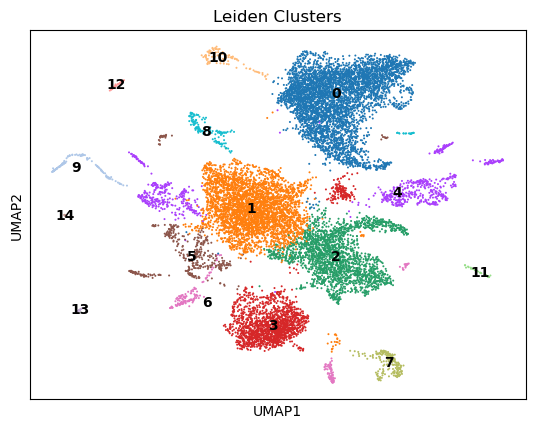

In [32]:
sc.pl.umap(adata, color='leiden_0.2', title='Leiden Clusters', legend_loc='on data')

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


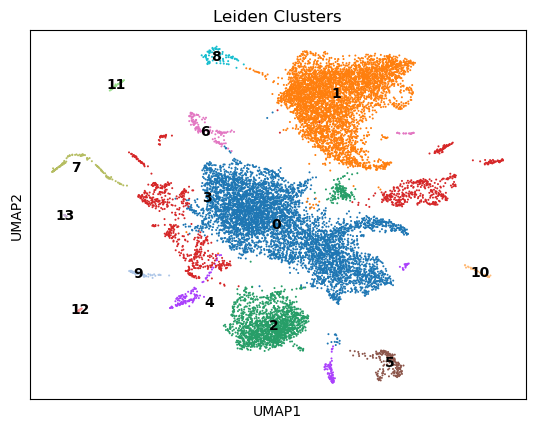

In [33]:
sc.tl.leiden(adata, resolution=0.1, key_added='leiden_0.1')
sc.pl.umap(adata, color='leiden_0.1', title='Leiden Clusters', legend_loc='on data')

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


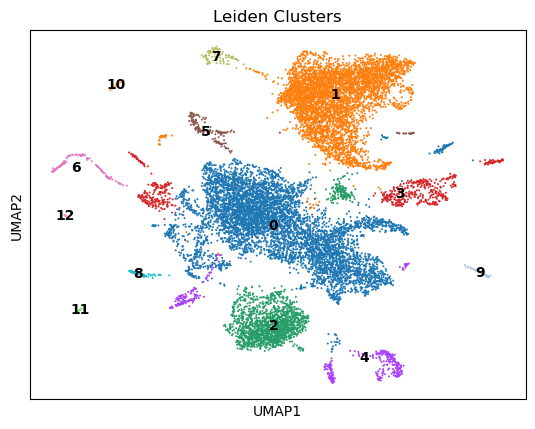

In [34]:
sc.tl.leiden(adata, resolution=0.05, key_added='leiden_0.05')
sc.pl.umap(adata, color='leiden_0.05', title='Leiden Clusters', legend_loc='on data')

In [36]:
print(adata.obs['leiden_0.05'].value_counts().sort_index())

leiden_0.05
0     6225
1     4654
2     1782
3      641
4      405
5      169
6      120
7       82
8       61
9       39
10      32
11      18
12      13
Name: count, dtype: int64


In [38]:
adata.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,umi_gene_ratio,leiden,leiden_0.2,leiden_0.1,leiden_0.05
AAACCTGAGAATTGTG-1,1380,4931.0,157.0,3.183938,3.573188,5,0,1,1
AAACCTGAGACACGAC-1,2754,14761.0,299.0,2.025608,5.359840,7,4,3,3
AAACCTGAGAGATGAG-1,1494,5658.0,109.0,1.926476,3.787149,3,3,2,2
AAACCTGAGATGTGTA-1,2291,11167.0,442.0,3.958091,4.874291,0,1,0,0
AAACCTGAGTATTGGA-1,897,2353.0,110.0,4.674883,2.623188,1,0,1,1
...,...,...,...,...,...,...,...,...,...
TTTGTCATCAACGAAA-1,2476,10868.0,581.0,5.345970,4.389338,0,1,0,0
TTTGTCATCACGCGGT-1,3121,18940.0,518.0,2.734952,6.068568,2,2,0,0
TTTGTCATCGCCATAA-1,850,3283.0,65.0,1.979896,3.862353,3,3,2,2
TTTGTCATCGTCCGTT-1,1618,10686.0,101.0,0.945162,6.604450,0,1,0,0


In [50]:
marker_zf = {
    "T_cell":       ["cd3d", "cd3e", "lck", "tcr-alpha"],
    "B_cell":       ["cd79a", "cd79b", "pax5", "ighm"],
    "Plasma_cell":  ["jchain", "sdc1", "iglc"],
    "Myeloid":      ["mpeg1", "csf1ra", "lyz"],
    "Neutrophil":   ["mpx", "lyz", "csf3r"],
    "DC":           ["cd4", "mhc2dab", "flt3"],
    "Mast_cell":    ["cma1", "mitf", "kit"],
    "Endothelial":  ["fli1", "cdh5", "pecam1"],
    "Proliferating":["mki67", "pcna", "top2a"]
}

In [51]:
def filter_markers(d, var):
    return {k: [g for g in v if g in var] for k, v in d.items()}

marker_genes = filter_markers(marker_zf, adata.var_names)

In [53]:
marker_genes

{'T_cell': [],
 'B_cell': ['cd79a'],
 'Plasma_cell': [],
 'Myeloid': ['lyz'],
 'Neutrophil': ['lyz'],
 'DC': ['mhc2dab', 'flt3'],
 'Mast_cell': [],
 'Endothelial': ['cdh5', 'pecam1'],
 'Proliferating': ['mki67', 'pcna', 'top2a']}

In [56]:
gene_list = 'mki67', 'pcna', 'top2a'

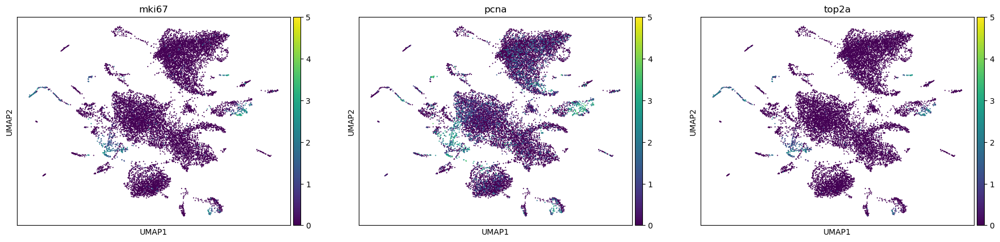

In [57]:
sc.pl.umap(adata, color=gene_list, ncols=4, vmax=5)

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', '

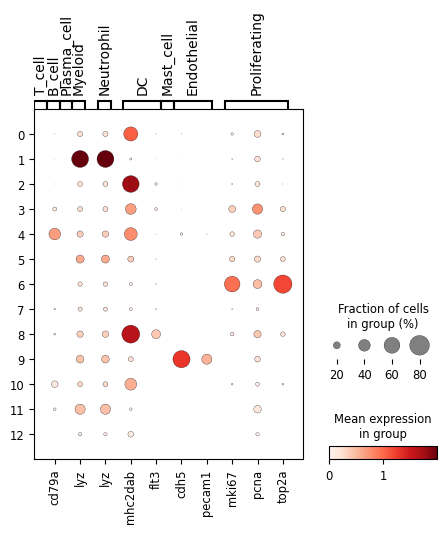

In [59]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden_0.05')

In [60]:
marker_zf = {
    "Macrophage (MP)":       ["csf1ra", "marco", "mfap4"],
    "Dendritic cell (DC)":   ["flt3", "spock3"],
    "Mesothelial cell (Meta)": ["il22ra2", "ptprc"],
    "B cell":                ["igl4v8", "igic1s1"],
    "NK-like cell (NKL)":    ["nkl.3", "nkl.4"],
    "il6r+ cell":            ["il6r", "nitr9"]
}

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


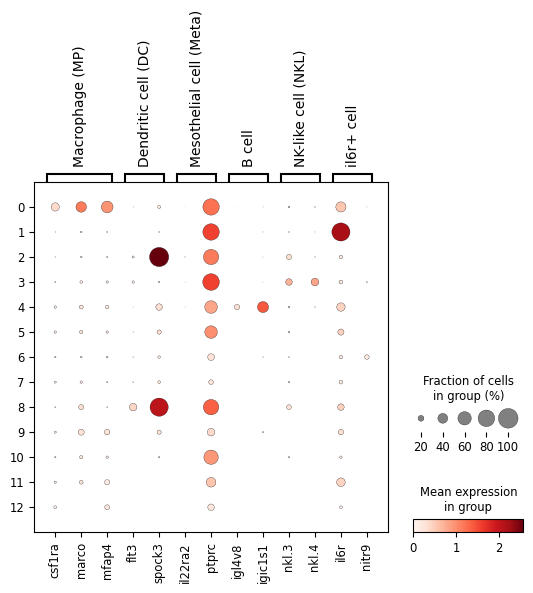

In [67]:
sc.pl.dotplot(adata, marker_zf, groupby='leiden_0.05')

In [64]:
# 关闭 pandas 未来警告
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [72]:
markers_zf = {
    "Macrophage":              ["mpeg1.1", "csf1ra", "marco", "mfap4", "c1qb"],
    "Pro-inflammatory MP":    ["lgals3bpb", "fabp7b", "tppp"],
    "Remodeling MP":           ["ccl34a.4", "mrc1b"],
    "Microglia":               ["p2ry12", "apoeb", "apoc1", "sall3b"],
    "cDC":                     ["ccl35.1", "nr4a2b", "mhc2dab", "cd74a"],
    "pDC":                     ["ctsbb", "p2rx3a", "tlr9", "irf7"],
    "Brain cDC":               ["cnn3a", "xcr1a.1", "batf3"],
    "Mesothelial cell":        ["il22ra2", "ptprc"],
    "B cell":                  ["igl4v8", "igic1s1", "pax5"],
    "NK-like cell":            ["nkl.3", "nkl.4", "il7r"],
    "il6r+ cell":              ["il6r", "il6st", "nitr9"]
}

/public/workspace/lhpeng/miniconda3/envs/TACMAN/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


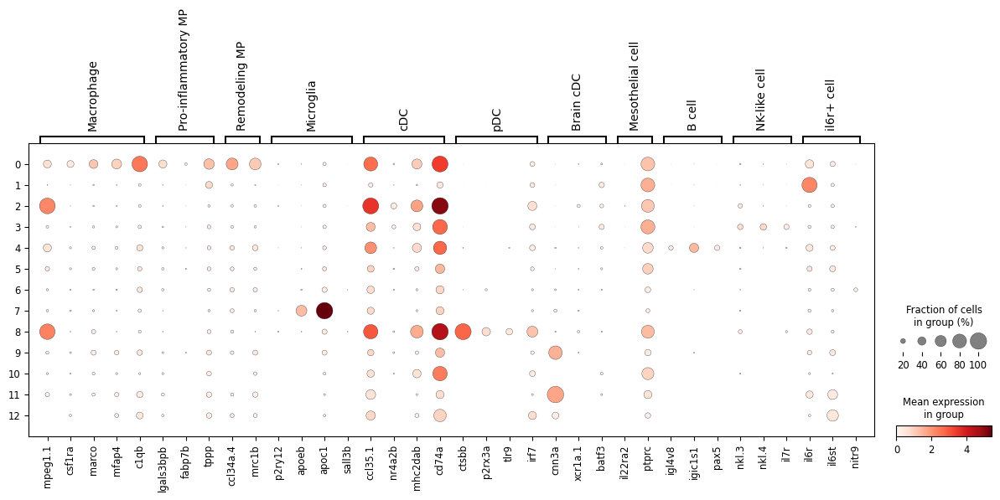

In [74]:
sc.pl.dotplot(adata, markers_zf, groupby='leiden_0.05')

# 检查celltypist细胞注释效果

In [34]:
# 小鼠免疫细胞经典 Marker（直接复制运行）
markers = {
    "T cell": ["Cd3d", "Cd3e", "Cd3g"],
    "CD4 T": ["Cd4"],
    "CD8 T": ["Cd8a", "Cd8b1"],
    "B cell": ["Cd19", "Ms4a1", "Cd79a"],
    "NK cell": ["Ncr1", "Gzma", "Gzmb", "Klrb1c"],
    "Macrophage": ["Adgre1", "Cd68", "Csf1r"],
    "Monocyte": ["Ly6c1", "Ly6c2", "Ccr2"],
    "DC": ["H2-Aa", "H2-Eb1", "Flt3"],
    "Neutrophil": ["S100a8", "S100a9", "Mmp9"],
    "Plasma cell": ["Jchain", "Sdc1"],
    "Mast cell": ["Kit"]
}

/public/workspace/lhpeng/miniconda3/envs/env_came/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


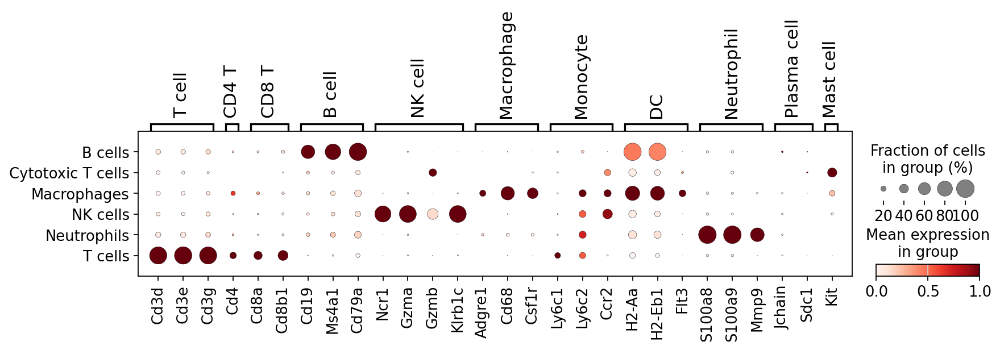

In [94]:
sc.pl.dotplot(adata_raw2, 
              var_names=markers, 
              groupby='cell_type', 
              standard_scale='var')

In [110]:
markers_human = {
    # T 细胞大类
    "T cell": ["CD3D", "CD3E", "CD3G"],
    "CD4 T cell": ["CD4"],
    "CD8 T cell": ["CD8A", "CD8B"],
    "Cytotoxic T cell": ["CD8A", "CD8B", "GZMB", "PRF1", "NKG7"],

    # B 细胞大类
    "B cell": ["CD19", "MS4A1", "CD79A", "CD79B"],
    "Memory B cell": ["CD27", "TNFRSF13B", "CD80"],
    "Plasma cell": ["JCHAIN", "SDC1", "PRDM1", "XBP1"],
    
    # 天然免疫细胞
    "NK cell": ["NCR1", "KLRD1", "GZMB", "PRF1", "FCGR3A"],
    "ILC": ["KIT", "IL7R", "CRTH2", "RORC", "TBX21"],  # 泛 ILC marker，不同亚群略有差异
    "Macrophage": ["CD68", "CSF1R", "CD163", "MRC1", "ADGRE1"],
    "Monocyte": ["CD14", "CD16", "FCGR3A", "S100A8", "S100A9"],
    "DC": ["HLA-DRA", "HLA-DPB1", "CD1C", "XCR1", "FLT3"],
}

In [111]:
filtered_markers = {}
for cell_type, genes in markers_human.items():
    valid_genes = [g for g in genes if g in adata_raw1.var_names]
    if valid_genes:
        filtered_markers[cell_type] = valid_genes

/public/workspace/lhpeng/miniconda3/envs/env_came/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


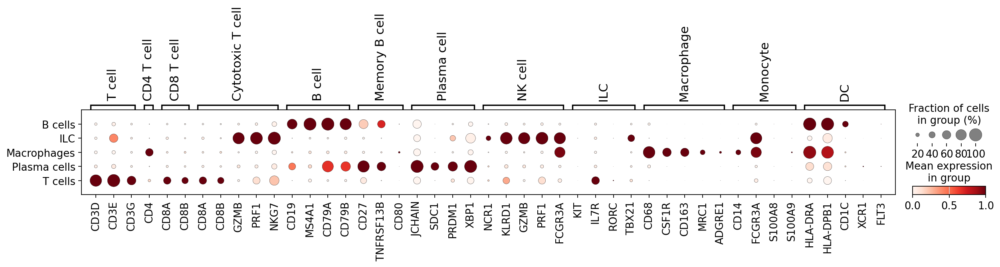

In [112]:
sc.pl.dotplot(adata_raw1, 
              var_names=filtered_markers, 
              groupby='cell_type', 
              standard_scale='var',
              save='human_imm_markers.svg')

## check ILC

In [118]:
# 建议的验证代码：在您的数据中检查这些关键基因
key_validation_genes = {
    'ILC core': ['ID2', 'TOX', 'RORC', 'GATA3'],  # 转录因子，定义ILC身份
    'ILC1': ['TBX21', 'IFNG'],                   # ILC1亚型的关键
    'exclude': ['CD3E', 'CD4', 'CD8A', 'CD19']  # 非T非B
}

# 1. 提取被注释为“ILC”的细胞
ilc_cells = adata_raw1[adata_raw1.obs['cell_type'] == 'ILC'].copy()

# 2. 计算并打印这些关键基因在ILC群中的平均表达
for category, genes in key_validation_genes.items():
    existing_genes = [g for g in genes if g in ilc_cells.var_names]
    if existing_genes:
        # 建议使用 .raw 中的标准化数据
        mean_expr = ilc_cells.raw[:, existing_genes].X.mean(axis=0).mean()
        print(f"{category} ({', '.join(existing_genes)}) 在ILC中的平均表达: {mean_expr:.3f}")
        if '排除性标记' in category and mean_expr > 0.5:
            print("  ⚠️  警告：排除性标记表达过高，需重新审视注释。")
    else:
        print(f"{category} 中的基因在数据中未找到。")

ILC core (ID2, TOX, RORC, GATA3) 在ILC中的平均表达: 0.448
ILC1 (TBX21, IFNG) 在ILC中的平均表达: 0.394
exclude (CD3E, CD4, CD8A, CD19) 在ILC中的平均表达: 0.751


In [119]:
filtered_markers = {}
for cell_type, genes in key_validation_genes.items():
    valid_genes = [g for g in genes if g in adata_raw1.var_names]
    if valid_genes:
        filtered_markers[cell_type] = valid_genes

/public/workspace/lhpeng/miniconda3/envs/env_came/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


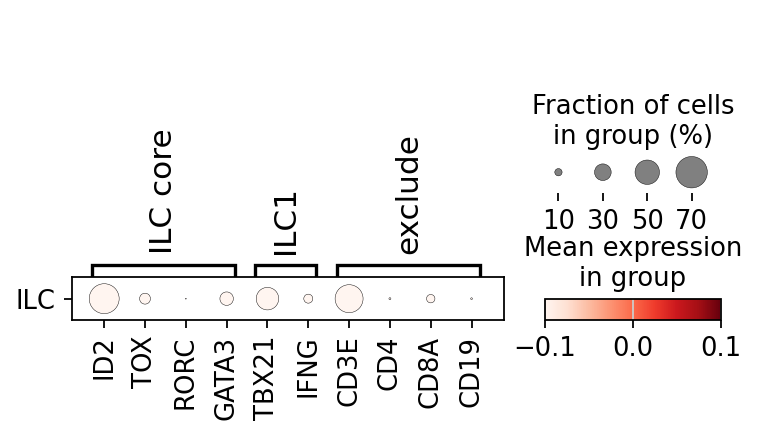

In [121]:
sc.pl.dotplot(ilc_cells, 
              var_names=filtered_markers, 
              groupby='cell_type', 
              standard_scale='var')